In [2]:
from dask.distributed import LocalCluster
# from dask_jobqueue import SLURMCluster
from dask.distributed import Client

cluster = LocalCluster()
# cluster = SLURMCluster(cores=24, name='test', walltime='00:30:00',
#                        job_extra=['--constraint=HSW24','--exclusive','--nodes=1'], 
#                        memory='512GB', interface='ib0'
#                       ) 
# cluster.scale(24)
# # cluster.adapt(minimum=1, maximum=48)

client = Client(cluster)
# client = Client()
client

/scratch/cnt0024/hmg2840/tuchida/envs/mai2021/lib/python3.9/site-packages/distributed/node.py:160: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 45274 instead
  warnings.warn(


Client Scheduler: tcp://127.0.0.1:33982 Dashboard: http://127.0.0.1:45274/status,Cluster Workers: 8 Cores: 56 Memory: 251.63 GiB


In [3]:
import numpy as np
import xarray as xr
import pandas as pd
import time
# import numpy_groupies
import dask.array as dsar
import xrft
import qgutils
from xgcm.grid import Grid
import os.path as op
# from dask.diagnostics import ProgressBar
import matplotlib.pyplot as plt
%matplotlib inline

In [4]:
ddir = '/store/CT1/hmg2840/tuchida/msqg/seas-forcing/'
rund = '/store/tuchida/msom/msqg/'
# ddir = '/store/CT1/hmg2840/tuchida/msqg/const-forcing/'

In [5]:
U = .1
T = 5e5       # seconds
tau0 = .0001
dt = 5e-2
Rd = 5e4      # Rossby radius (50km)
Re4 = 4e3
# f0 = 8e-5
beta = .5
N = 256*4     # Number of horizontal grids
L0 = 80
H = 5e3
dx = L0/N     # Non-dimensionalized horizontal resolution ((L0*Rd)/N)/Rd
diny = 360
Rom = .025
Ekb = .002*2
ntime = 187

percent = 10
nmemb = 100

In [6]:
def pad_bc(psi, bc='dirichlet'):
    """
    Pad field psi with Dirichlet or Neumann boundary conditions
    Parameters
    ----------
    psi : array [nt,nz (,ny,nx)]
    bc   : 'dirichlet' or 'neumann'
    Returns
    -------
    psi_bc: array [nt,nz (,ny+2,nx+2)]
    """
    nd = psi.ndim
    # only pad horizontal dimensions
    if nd == 4:
        psi = np.pad(psi,((0,0),(0,0),(1,1),(1,1)),'constant')
    elif nd == 5:
        psi = np.pad(psi,((0,0),(0,0),(0,0),(1,1),(1,1)),'constant')

    if (bc == 'dirichlet'): 
        psi[...,0,:]  = -psi[...,1,:]
        psi[...,-1,:] = -psi[...,-2,:]
        psi[...,:,0]  = -psi[...,:,1]
        psi[...,:,-1] = -psi[...,:,-2]
    
        # corners
        psi[...,0,0]   = -psi[...,0,1]   - psi[...,1,0]   - psi[...,1,1]
        psi[...,-1,0]  = -psi[...,-1,1]  - psi[...,-2,0]  - psi[...,-2,1]
        psi[...,0,-1]  = -psi[...,1,-1]  - psi[...,0,-2]  - psi[...,1,-2]
        psi[...,-1,-1] = -psi[...,-1,-2] - psi[...,-2,-2] - psi[...,-2,-1]

    elif (bc == 'neumann'): 
        psi[...,0,:]  = psi[...,1,:]
        psi[...,-1,:] = psi[...,-2,:]
        psi[...,:,0]  = psi[...,:,1]
        psi[...,:,-1] = psi[...,:,-2]
    
        # corners
        psi[...,0,0]   = psi[...,1,1]
        psi[...,-1,0]  = psi[...,-2,1]
        psi[...,0,-1]  = psi[...,1,-2]
        psi[...,-1,-1] = psi[...,-2,-2]

    return psi


def laplacian(psi, Delta=1, bc='dirichlet', padded=False, 
              dim=['Z','Yp1','Xp1'], chunks={'Yp1':100,'Xp1':100}
             ):
    
    nd = psi.ndim
    if padded:
        psi_padded = psi
    else:
        if nd == 3:
            psi_padded = xr.DataArray(qgutils.pad_bc(psi), dims=dim,
                                      coords={'Yp1':np.arange(-dx/2,L0+dx,dx),
                                              'Xp1':np.arange(-dx/2,L0+dx,dx)}
                                     ).chunk(chunks)
        else:
            psi_padded = xr.DataArray(pad_bc(psi), dims=dim,
                                      coords={'Yp1':np.arange(-dx/2,L0+dx,dx),
                                              'Xp1':np.arange(-dx/2,L0+dx,dx)}
                                     ).chunk(chunks)

    lap = (psi_padded.isel(Yp1=slice(2,None),Xp1=slice(1,-1)).data 
           + psi_padded.isel(Yp1=slice(None,-2),Xp1=slice(1,-1)).data
           + psi_padded.isel(Yp1=slice(1,-1),Xp1=slice(2,None)).data 
           + psi_padded.isel(Yp1=slice(1,-1),Xp1=slice(None,-2)).data
           - 4*psi_padded.isel(Yp1=slice(1,-1),Xp1=slice(1,-1)).data
          ) / Delta**2

    return xr.DataArray(lap, dims=psi_padded.dims, 
                        coords=psi_padded.isel(Yp1=slice(1,-1),Xp1=slice(1,-1)).coords
                       )

distributed.utils_perf - WARNING - full garbage collections took 26% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 27% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 28% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 30% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 33% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 40% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 41% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 41% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 40% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took

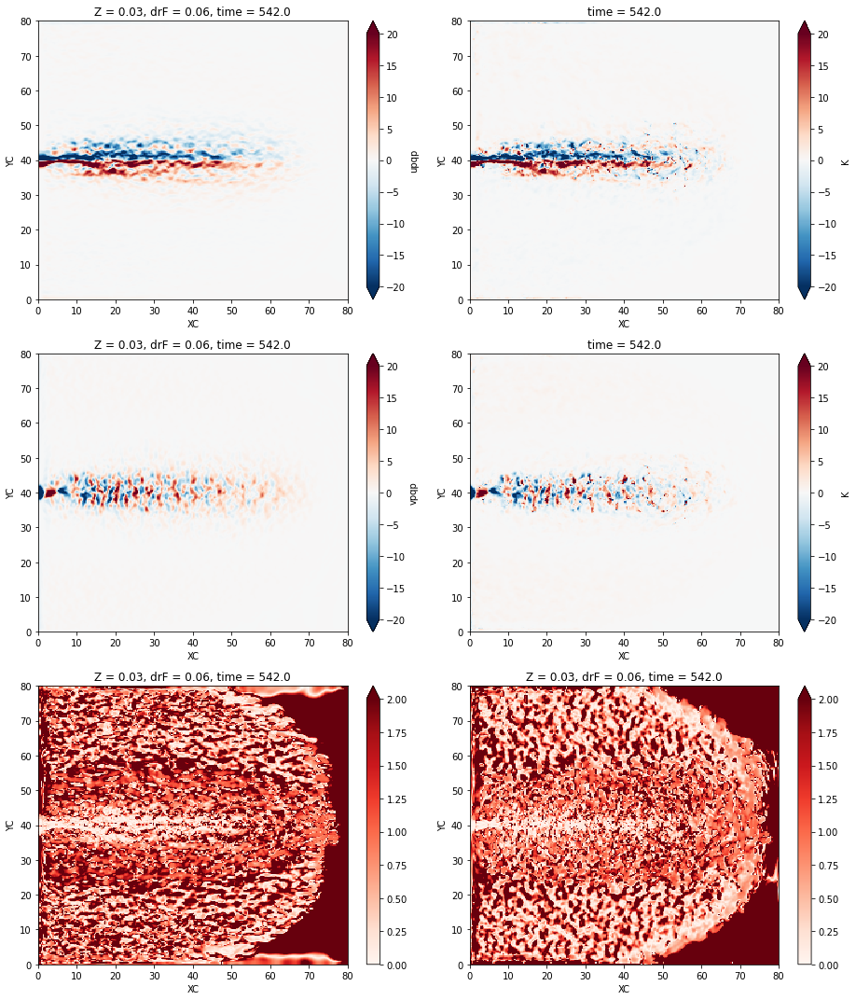

<xarray.Dataset>
Dimensions:  (XC: 256, YC: 256, time: 7)
Coordinates:
  * XC       (XC) float64 0.1562 0.4688 0.7812 1.094 ... 78.91 79.22 79.53 79.84
  * YC       (YC) float64 0.1562 0.4688 0.7812 1.094 ... 78.91 79.22 79.53 79.84
    Z        float64 0.03
    drF      float64 0.06
  * time     (time) float32 542.0 543.0 544.0 545.0 546.0 547.0 548.0
Data variables:
    exq      (time, YC, XC) float64 2.211 5.201 3.144 ... 43.62 114.1 63.93
    eyq      (time, YC, XC) float64 1.026 6.746 22.52 ... 127.5 31.58 1.468
    exP0     (time, YC, XC) float64 3.557 0.1351 0.1975 ... 1.638e+04 1.564e+07
    eyP0     (time, YC, XC) float64 3.224 4.473 5.636 ... 2.79e+07 1.535e+07
    exP1     (time, YC, XC) float64 13.02 0.384 0.552 ... 2.115 2.156 7.347e+06
    eyP1     (time, YC, XC) float64 14.15 19.06 30.65 ... 6.968e+06 7.398e+06
    exP2     (time, YC, XC) float64 2.314 0.0685 0.04606 ... 1.711e+04 4.902e+05
    eyP2     (time, YC, XC) float64 2.231 2.936 4.135 ... 9.297e+05 4.669e+05
   

distributed.utils_perf - WARNING - full garbage collections took 24% CPU time recently (threshold: 10%)


$r^x_q$: [0.85165173 0.8426557  0.86036031 0.86664925 0.82270066 0.83897317
 0.84638203] $r^y_q$: [0.87814264 0.87329207 0.89379949 0.86800916 0.85391396 0.86204388
 0.79728636]
$r^x_\theta$: [0.92518352 0.92880226 0.91997322 0.92647683 0.92770722 0.92739505
 0.9223508 ] $r^y_\theta$: [0.93015195 0.93065711 0.9183338  0.924759   0.93150416 0.92870076
 0.91798897]
$r^x_s$: [0.97126003 0.97189506 0.97141098 0.97291394 0.97491983 0.97336208
 0.97118245] $r^y_s$: [0.99617448 0.99617174 0.99601198 0.99606043 0.99642327 0.9961261
 0.99629562]


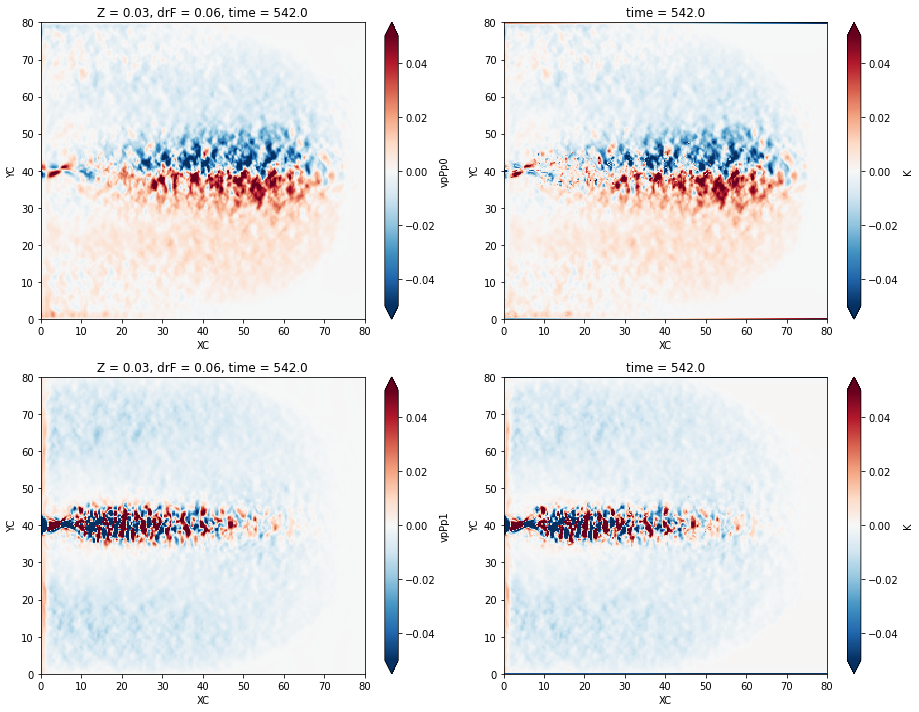

Lapse time: 19.956532955169678


distributed.utils_perf - WARNING - full garbage collections took 23% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 23% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 24% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 24% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 24% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 24% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 24% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 24% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 25% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took

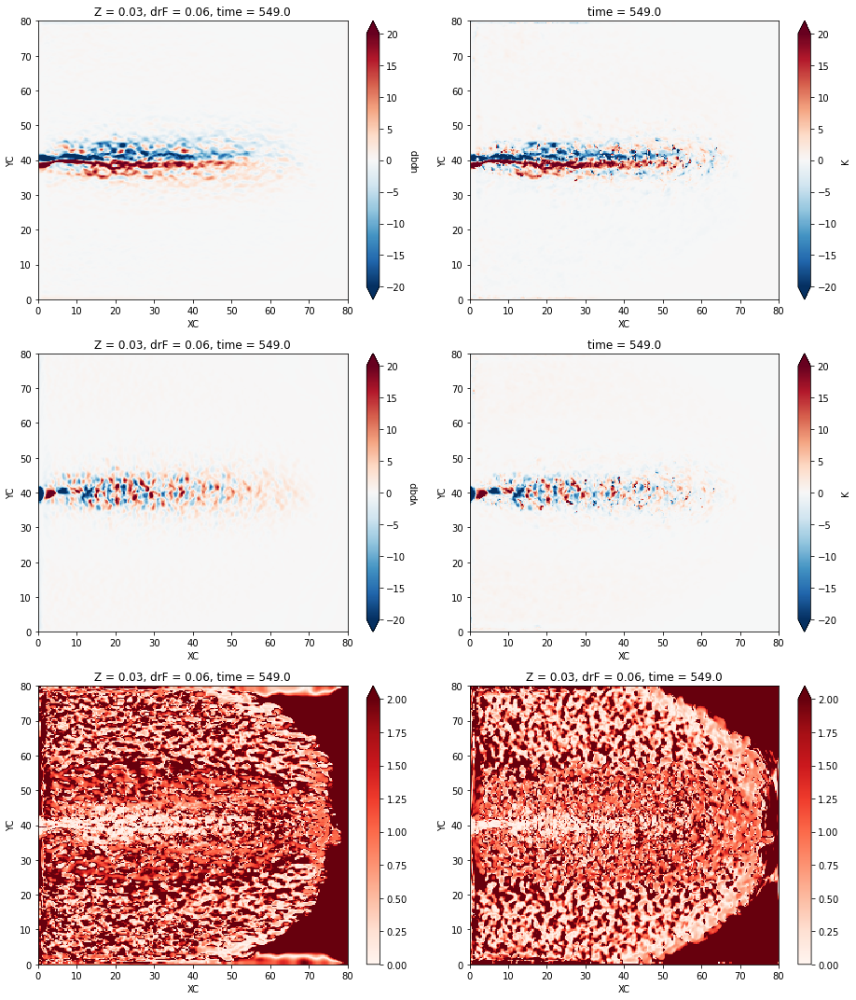

<xarray.Dataset>
Dimensions:  (XC: 256, YC: 256, time: 7)
Coordinates:
  * XC       (XC) float64 0.1562 0.4688 0.7812 1.094 ... 78.91 79.22 79.53 79.84
  * YC       (YC) float64 0.1562 0.4688 0.7812 1.094 ... 78.91 79.22 79.53 79.84
    Z        float64 0.03
    drF      float64 0.06
  * time     (time) float32 549.0 550.0 551.0 552.0 553.0 554.0 555.0
Data variables:
    exq      (time, YC, XC) float64 2.836 8.676 3.28 ... 11.68 26.74 87.97
    eyq      (time, YC, XC) float64 1.416 10.97 30.93 ... 126.6 6.758 102.8
    exP0     (time, YC, XC) float64 3.252 0.0147 0.04196 ... 1.047e+04 1.35e+07
    eyP0     (time, YC, XC) float64 3.059 3.524 3.875 ... 1.628e+07 1.357e+07
    exP1     (time, YC, XC) float64 12.02 0.07278 0.1728 ... 2.187 6.642e+06
    eyP1     (time, YC, XC) float64 13.13 16.15 23.13 ... 6.825e+06 6.681e+06
    exP2     (time, YC, XC) float64 2.141 0.02239 ... 1.066e+04 4.177e+05
    eyP2     (time, YC, XC) float64 2.25 2.933 4.138 ... 5.212e+05 4.073e+05
    exP3     (

distributed.utils_perf - WARNING - full garbage collections took 29% CPU time recently (threshold: 10%)


$r^x_q$: [0.85137313 0.82624418 0.81016631 0.84840274 0.83752027 0.81424456
 0.84266028] $r^y_q$: [0.88553777 0.83810022 0.87105122 0.85488462 0.87201931 0.85574507
 0.84833849]
$r^x_\theta$: [0.92655861 0.92678065 0.92314705 0.92502354 0.93049832 0.93032844
 0.92413009] $r^y_\theta$: [0.91967232 0.92484142 0.92084627 0.92947619 0.93081488 0.92884395
 0.92201541]
$r^x_s$: [0.97064752 0.96907781 0.97017621 0.96959369 0.97308665 0.97220225
 0.97176259] $r^y_s$: [0.99624215 0.99641945 0.99646542 0.99628704 0.99601634 0.99604071
 0.99616685]


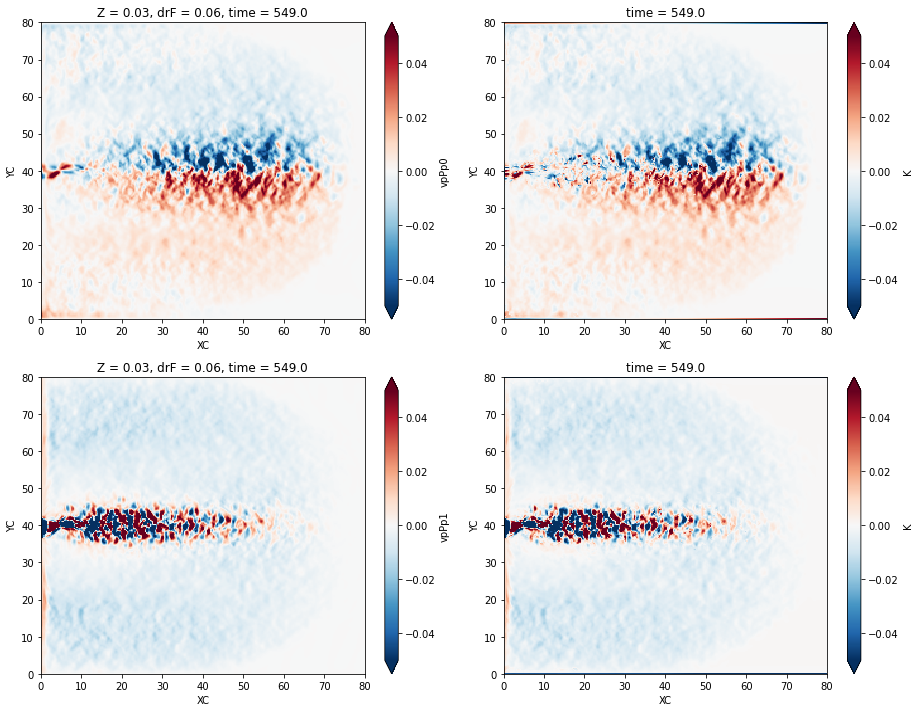

Lapse time: 18.138285398483276


distributed.utils_perf - WARNING - full garbage collections took 27% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 27% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 27% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 27% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 27% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 27% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 27% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 27% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 27% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took

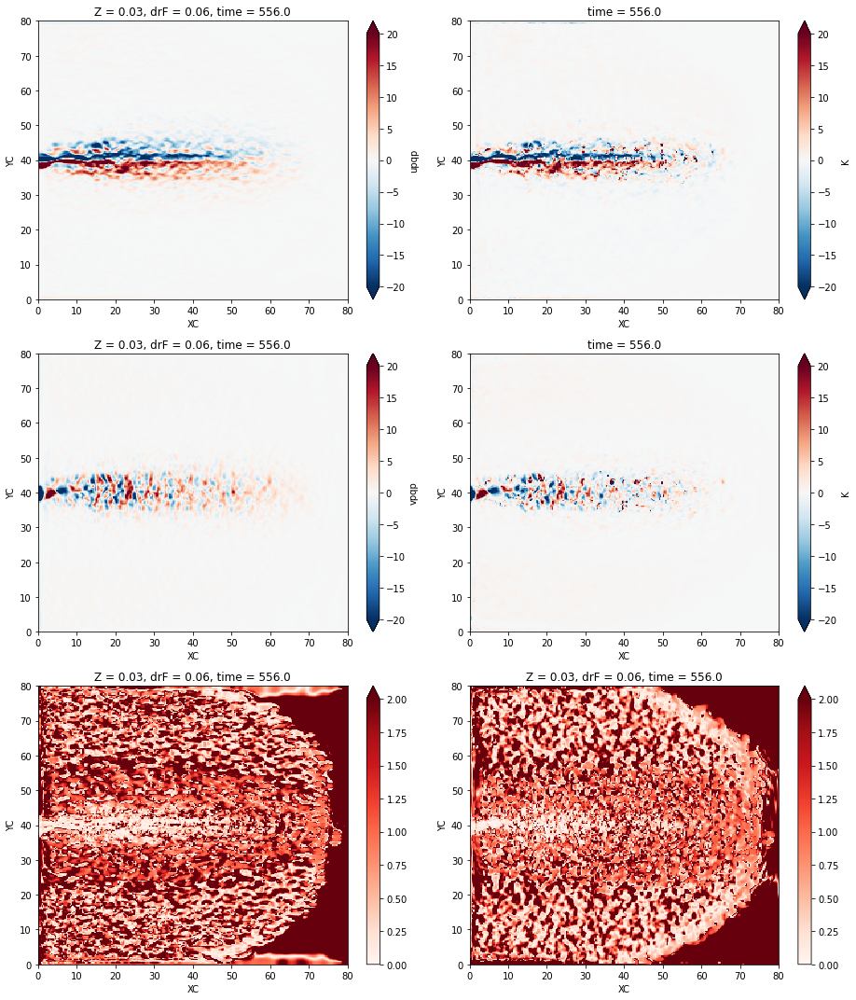

<xarray.Dataset>
Dimensions:  (XC: 256, YC: 256, time: 7)
Coordinates:
  * XC       (XC) float64 0.1562 0.4688 0.7812 1.094 ... 78.91 79.22 79.53 79.84
  * YC       (YC) float64 0.1562 0.4688 0.7812 1.094 ... 78.91 79.22 79.53 79.84
    Z        float64 0.03
    drF      float64 0.06
  * time     (time) float32 556.0 557.0 558.0 559.0 560.0 561.0 562.0
Data variables:
    exq      (time, YC, XC) float64 4.927 4.487 1.523 ... 20.85 145.5 170.9
    eyq      (time, YC, XC) float64 3.927 6.416 16.45 ... 2.448e+03 462.8 47.66
    exP0     (time, YC, XC) float64 2.999 0.1535 0.1708 ... 5.409e+04 3.938e+07
    eyP0     (time, YC, XC) float64 2.665 3.277 4.019 ... 4.094e+08 3.847e+07
    exP1     (time, YC, XC) float64 9.681 0.4693 0.5891 ... 4.956 2.674e+07
    eyP1     (time, YC, XC) float64 11.31 15.58 27.87 ... 2.389e+07 2.78e+07
    exP2     (time, YC, XC) float64 2.127 0.00979 ... 5.669e+04 1.223e+06
    eyP2     (time, YC, XC) float64 2.17 2.935 4.405 ... 1.905e+07 1.16e+06
    exP3    

distributed.utils_perf - WARNING - full garbage collections took 30% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 30% CPU time recently (threshold: 10%)


$r^x_q$: [0.81108057 0.85527688 0.84272999 0.80680632 0.83239425 0.82463146
 0.81640703] $r^y_q$: [0.85870299 0.86707031 0.8693622  0.8465042  0.8475808  0.85459583
 0.88478986]
$r^x_\theta$: [0.92306363 0.92668058 0.92161548 0.9169703  0.92676267 0.92516694
 0.92487256] $r^y_\theta$: [0.92130174 0.92015426 0.91275364 0.91294375 0.91981866 0.91869649
 0.91778254]
$r^x_s$: [0.96820469 0.96947548 0.96873975 0.97025199 0.97067405 0.96943008
 0.96790946] $r^y_s$: [0.99592062 0.99588302 0.99596347 0.99618093 0.99656175 0.99668189
 0.99687968]


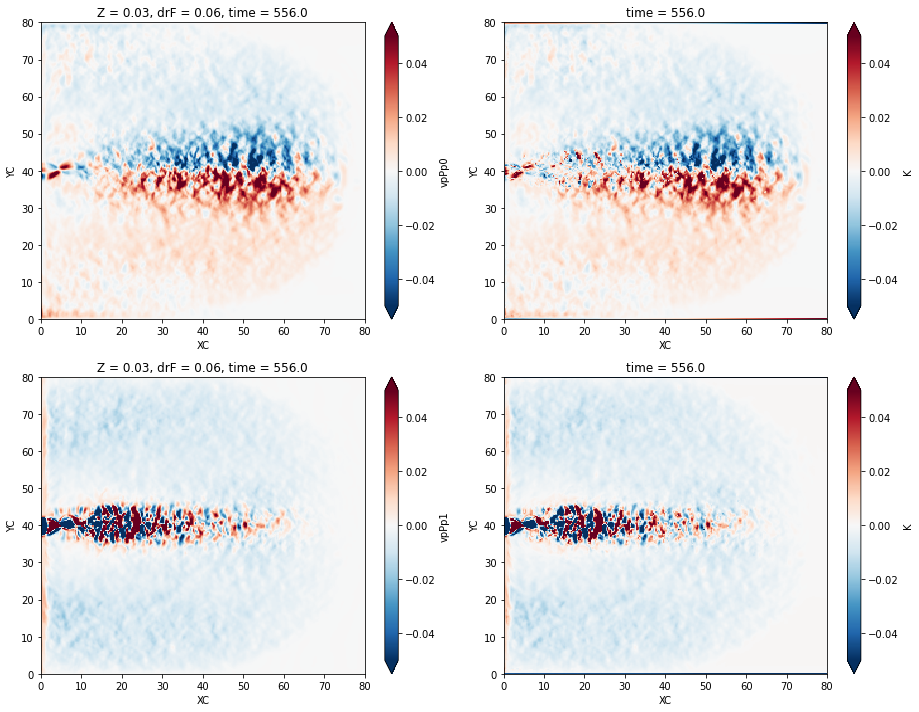

Lapse time: 19.089521408081055


distributed.utils_perf - WARNING - full garbage collections took 29% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 29% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 29% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 29% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 29% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 29% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 29% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 29% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 29% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took

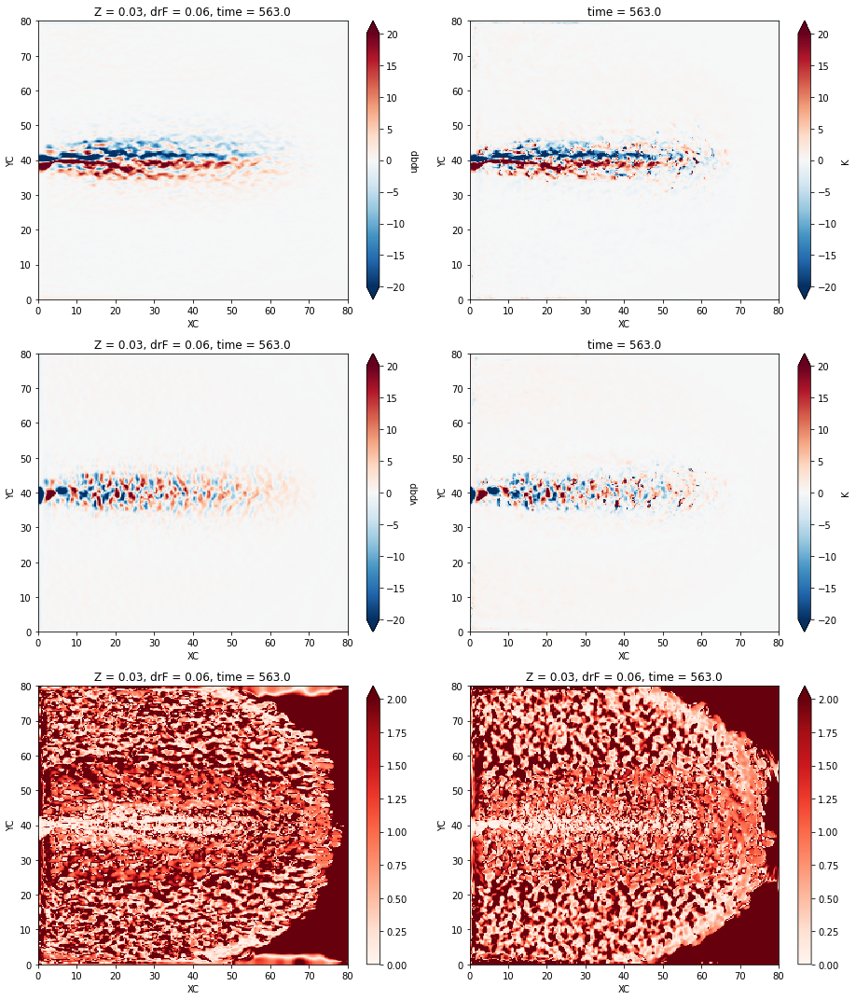

<xarray.Dataset>
Dimensions:  (XC: 256, YC: 256, time: 7)
Coordinates:
  * XC       (XC) float64 0.1562 0.4688 0.7812 1.094 ... 78.91 79.22 79.53 79.84
  * YC       (YC) float64 0.1562 0.4688 0.7812 1.094 ... 78.91 79.22 79.53 79.84
    Z        float64 0.03
    drF      float64 0.06
  * time     (time) float32 563.0 564.0 565.0 566.0 567.0 568.0 569.0
Data variables:
    exq      (time, YC, XC) float64 5.267 7.368 2.576 ... 14.75 56.95 174.3
    eyq      (time, YC, XC) float64 3.484 10.52 12.13 ... 573.1 3.192e+03 12.34
    exP0     (time, YC, XC) float64 3.097 0.05784 0.09332 ... 3.99e+04 4.035e+07
    eyP0     (time, YC, XC) float64 2.843 3.197 3.506 ... 1.214e+08 4.006e+07
    exP1     (time, YC, XC) float64 12.03 0.2191 0.3509 ... 4.391 2.123e+07
    eyP1     (time, YC, XC) float64 12.93 16.88 24.99 ... 1.969e+07 2.171e+07
    exP2     (time, YC, XC) float64 2.267 0.05916 ... 4.053e+04 1.239e+06
    eyP2     (time, YC, XC) float64 2.212 2.764 3.963 ... 3.958e+06 1.194e+06
    exP3

distributed.utils_perf - WARNING - full garbage collections took 35% CPU time recently (threshold: 10%)


$r^x_q$: [0.84532881 0.82544406 0.80712507 0.81907844 0.8150898  0.83430731
 0.81166482] $r^y_q$: [0.89349814 0.76437636 0.87498975 0.84752037 0.86801114 0.89827299
 0.9039116 ]
$r^x_\theta$: [0.92778678 0.92710001 0.93157191 0.92775051 0.93389728 0.92733473
 0.92520336] $r^y_\theta$: [0.92309199 0.92299041 0.92591337 0.92168201 0.92180533 0.91092254
 0.92042341]
$r^x_s$: [0.97405951 0.97135546 0.96796194 0.96948352 0.97086795 0.96886746
 0.96929322] $r^y_s$: [0.9969504  0.99710197 0.99706148 0.99691646 0.99601106 0.99414774
 0.99380634]


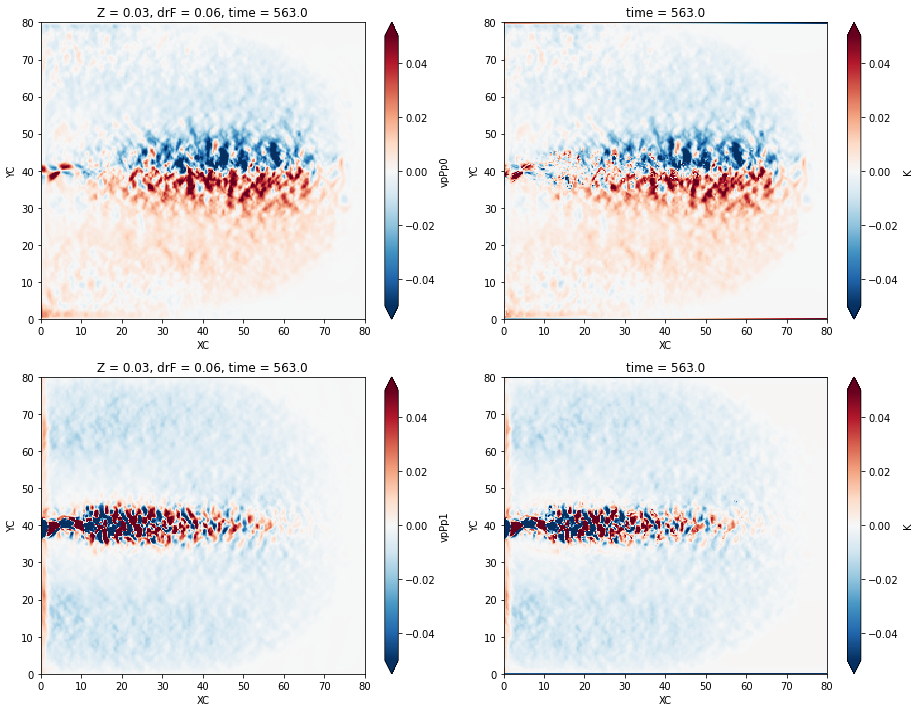

Lapse time: 18.893420934677124


distributed.utils_perf - WARNING - full garbage collections took 33% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 33% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 33% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 33% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 33% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 33% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 33% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 33% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 33% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took

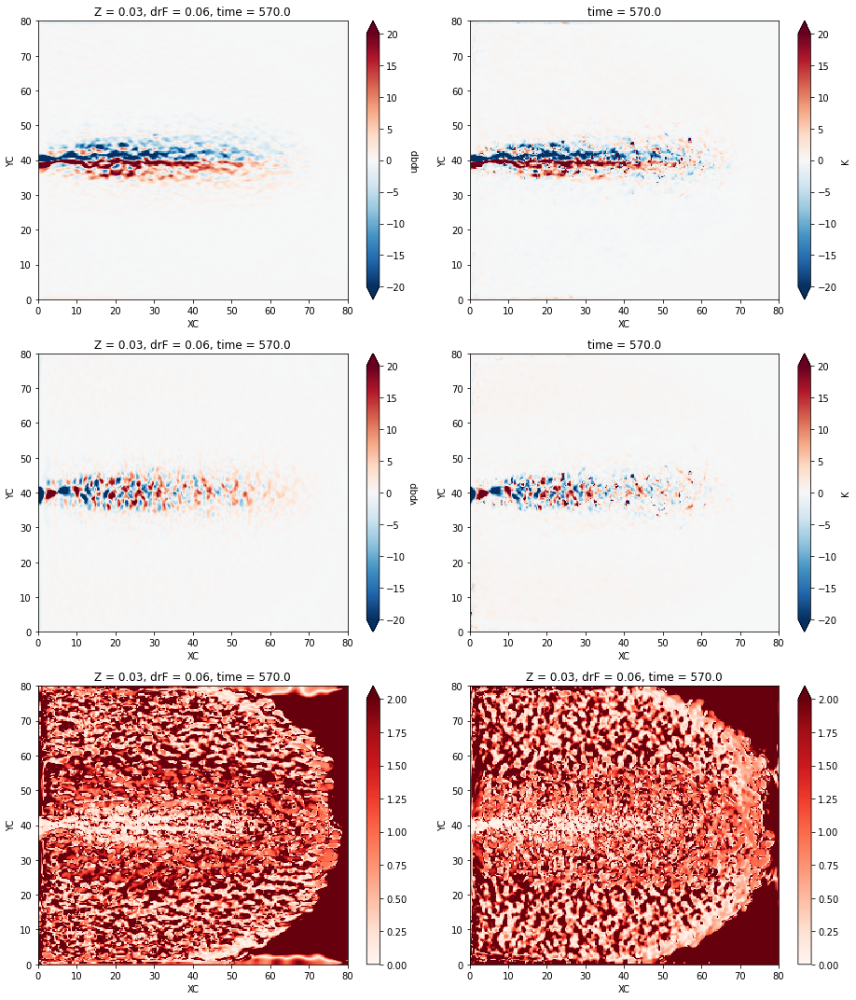

<xarray.Dataset>
Dimensions:  (XC: 256, YC: 256, time: 7)
Coordinates:
  * XC       (XC) float64 0.1562 0.4688 0.7812 1.094 ... 78.91 79.22 79.53 79.84
  * YC       (YC) float64 0.1562 0.4688 0.7812 1.094 ... 78.91 79.22 79.53 79.84
    Z        float64 0.03
    drF      float64 0.06
  * time     (time) float32 570.0 571.0 572.0 573.0 574.0 575.0 576.0
Data variables:
    exq      (time, YC, XC) float64 6.998 9.266 2.542 ... 22.73 68.25 247.4
    eyq      (time, YC, XC) float64 4.928 12.65 7.052 ... 1.695e+03 36.6
    exP0     (time, YC, XC) float64 2.44 0.07838 0.08174 ... 2.721e+04 3.029e+07
    eyP0     (time, YC, XC) float64 2.138 2.444 2.923 ... 6.609e+07 3.042e+07
    exP1     (time, YC, XC) float64 9.693 0.2746 0.3037 ... 3.842 1.369e+07
    eyP1     (time, YC, XC) float64 10.79 12.93 18.18 ... 1.305e+07 1.375e+07
    exP2     (time, YC, XC) float64 2.004 0.009847 ... 2.758e+04 9.312e+05
    eyP2     (time, YC, XC) float64 2.002 2.473 3.612 ... 2.121e+06 9.075e+05
    exP3     (

distributed.utils_perf - WARNING - full garbage collections took 32% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 32% CPU time recently (threshold: 10%)


$r^x_q$: [0.83423138 0.85580333 0.85816582 0.77731023 0.82977691 0.854416
 0.81277944] $r^y_q$: [0.88488469 0.87846231 0.90448207 0.88248918 0.90136361 0.89000755
 0.88513953]
$r^x_\theta$: [0.92970174 0.92600387 0.92617122 0.92226754 0.92490407 0.92324925
 0.92002573] $r^y_\theta$: [0.91067552 0.92152463 0.91966496 0.93089081 0.92092203 0.92301383
 0.92852386]
$r^x_s$: [0.97286815 0.97223458 0.9712334  0.97011824 0.96795093 0.9688482
 0.9646647 ] $r^y_s$: [0.99575295 0.99676386 0.99695872 0.99711837 0.99693306 0.99719849
 0.99690947]


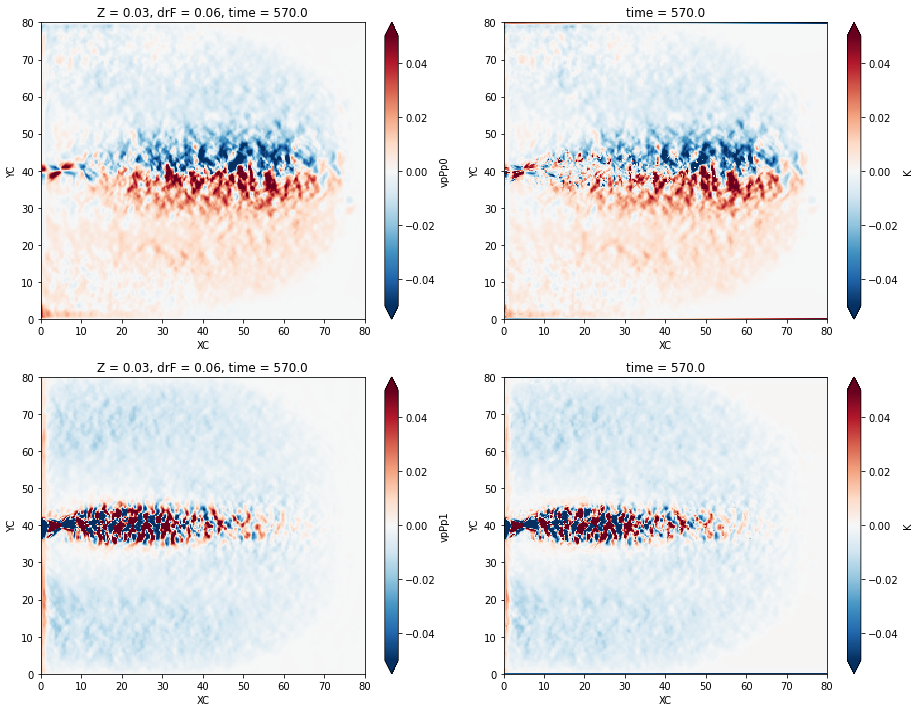

Lapse time: 19.804771184921265


distributed.utils_perf - WARNING - full garbage collections took 31% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 31% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 31% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 31% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 31% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 31% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 31% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 31% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 31% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took

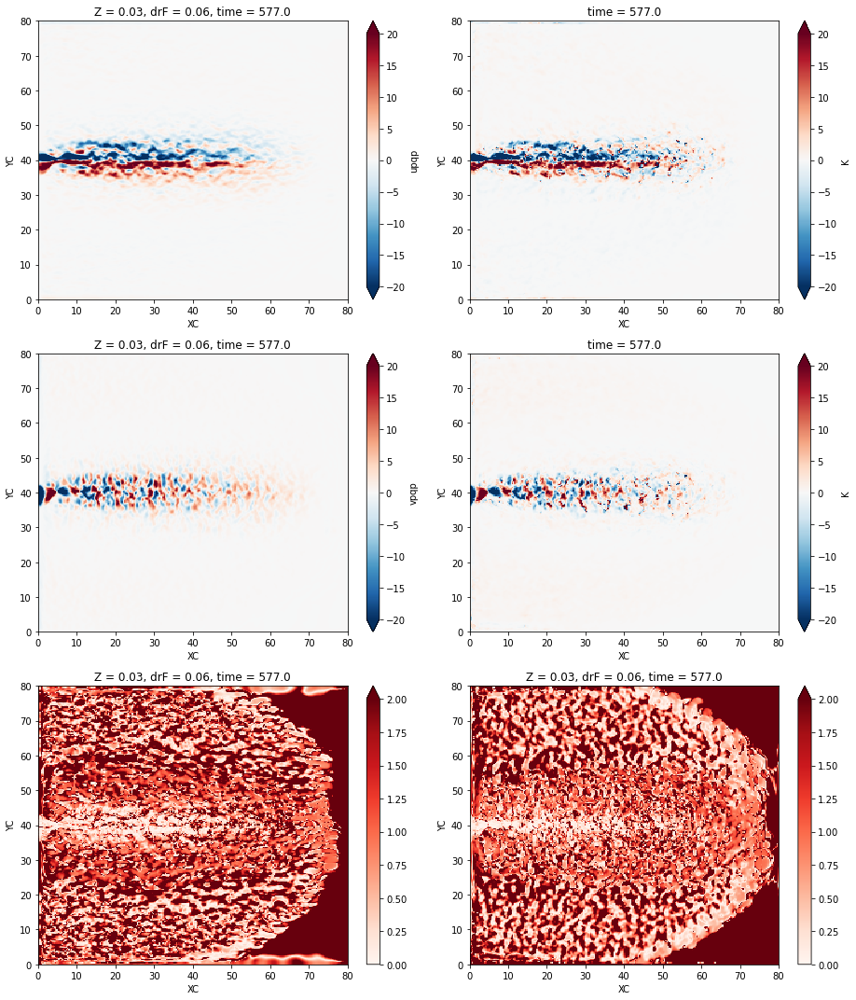

<xarray.Dataset>
Dimensions:  (XC: 256, YC: 256, time: 7)
Coordinates:
  * XC       (XC) float64 0.1562 0.4688 0.7812 1.094 ... 78.91 79.22 79.53 79.84
  * YC       (YC) float64 0.1562 0.4688 0.7812 1.094 ... 78.91 79.22 79.53 79.84
    Z        float64 0.03
    drF      float64 0.06
  * time     (time) float32 577.0 578.0 579.0 580.0 581.0 582.0 583.0
Data variables:
    exq      (time, YC, XC) float64 6.354 8.334 1.649 ... 303.0 77.49 124.6
    eyq      (time, YC, XC) float64 4.892 12.45 16.95 ... 273.8 144.6 59.36
    exP0     (time, YC, XC) float64 2.862 0.06969 0.1108 ... 5.531e+05 4.816e+07
    eyP0     (time, YC, XC) float64 2.613 2.632 2.831 ... 9.985e+07 4.592e+07
    exP1     (time, YC, XC) float64 11.61 0.2487 0.4401 ... 4.417 1.659e+07
    eyP1     (time, YC, XC) float64 12.7 13.99 18.18 ... 1.555e+07 1.7e+07
    exP2     (time, YC, XC) float64 2.51 0.02084 ... 6.126e+05 1.47e+06
    eyP2     (time, YC, XC) float64 2.625 3.035 3.955 ... 3.059e+06 1.361e+06
    exP3     (tim

distributed.utils_perf - WARNING - full garbage collections took 31% CPU time recently (threshold: 10%)


$r^x_q$: [0.79093037 0.78515906 0.80040652 0.83947923 0.81348994 0.83138838
 0.79004513] $r^y_q$: [0.87208139 0.88547541 0.89765303 0.8917076  0.88128622 0.84399413
 0.78655101]
$r^x_\theta$: [0.92050833 0.92127057 0.92067637 0.92029945 0.92374658 0.91632001
 0.91960201] $r^y_\theta$: [0.91888135 0.93052116 0.92478024 0.92936918 0.92891924 0.9231925
 0.9236711 ]
$r^x_s$: [0.9631343  0.96551915 0.96889094 0.96641964 0.96833187 0.96736966
 0.96991593] $r^y_s$: [0.99663011 0.99704221 0.99707789 0.99691965 0.99672102 0.99618571
 0.99625805]


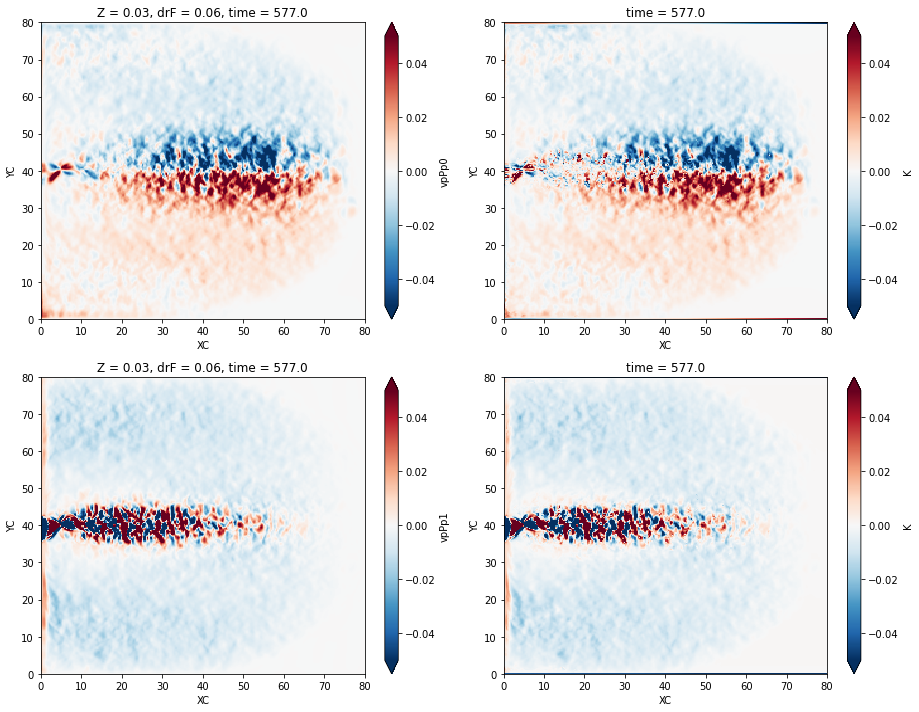

Lapse time: 19.081709146499634


distributed.utils_perf - WARNING - full garbage collections took 30% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 31% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 31% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 31% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 31% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 31% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 31% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 31% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 31% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took

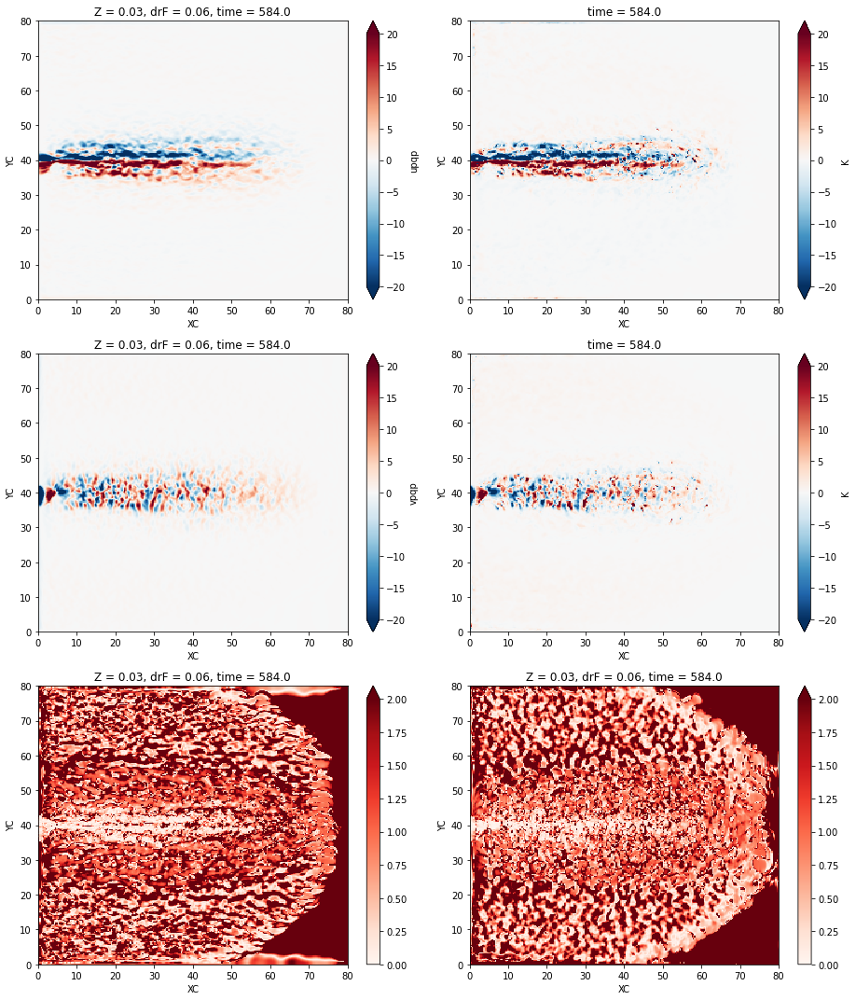

<xarray.Dataset>
Dimensions:  (XC: 256, YC: 256, time: 7)
Coordinates:
  * XC       (XC) float64 0.1562 0.4688 0.7812 1.094 ... 78.91 79.22 79.53 79.84
  * YC       (YC) float64 0.1562 0.4688 0.7812 1.094 ... 78.91 79.22 79.53 79.84
    Z        float64 0.03
    drF      float64 0.06
  * time     (time) float32 584.0 585.0 586.0 587.0 588.0 589.0 590.0
Data variables:
    exq      (time, YC, XC) float64 5.745 6.493 1.557 ... 13.64 54.48 168.7
    eyq      (time, YC, XC) float64 3.952 9.877 18.58 ... 457.4 1.971e+03 79.18
    exP0     (time, YC, XC) float64 2.959 0.09472 ... 3.267e+04 3.329e+07
    eyP0     (time, YC, XC) float64 2.631 2.785 2.983 ... 6.13e+07 3.241e+07
    exP1     (time, YC, XC) float64 10.72 0.2888 0.3201 ... 6.824 2.972e+07
    eyP1     (time, YC, XC) float64 12.03 13.61 18.43 ... 2.194e+07 3.018e+07
    exP2     (time, YC, XC) float64 2.467 0.01623 ... 3.408e+04 1.042e+06
    eyP2     (time, YC, XC) float64 2.498 3.01 3.928 ... 2.064e+06 9.851e+05
    exP3     (tim

distributed.utils_perf - WARNING - full garbage collections took 37% CPU time recently (threshold: 10%)


$r^x_q$: [0.84504467 0.81561902 0.81888923 0.81233415 0.79905941 0.78368499
 0.82617093] $r^y_q$: [0.88554953 0.88160814 0.87840509 0.87468183 0.88545344 0.88312344
 0.89229504]
$r^x_\theta$: [0.92117299 0.92295774 0.92718441 0.92602599 0.91898593 0.92124845
 0.92357189] $r^y_\theta$: [0.91706557 0.91685186 0.92082221 0.91677988 0.91577959 0.91951368
 0.91536026]
$r^x_s$: [0.97095786 0.96918196 0.9695023  0.96904907 0.96800618 0.96643966
 0.96969147] $r^y_s$: [0.99636822 0.99649906 0.99658218 0.996529   0.99639708 0.99643664
 0.99649539]


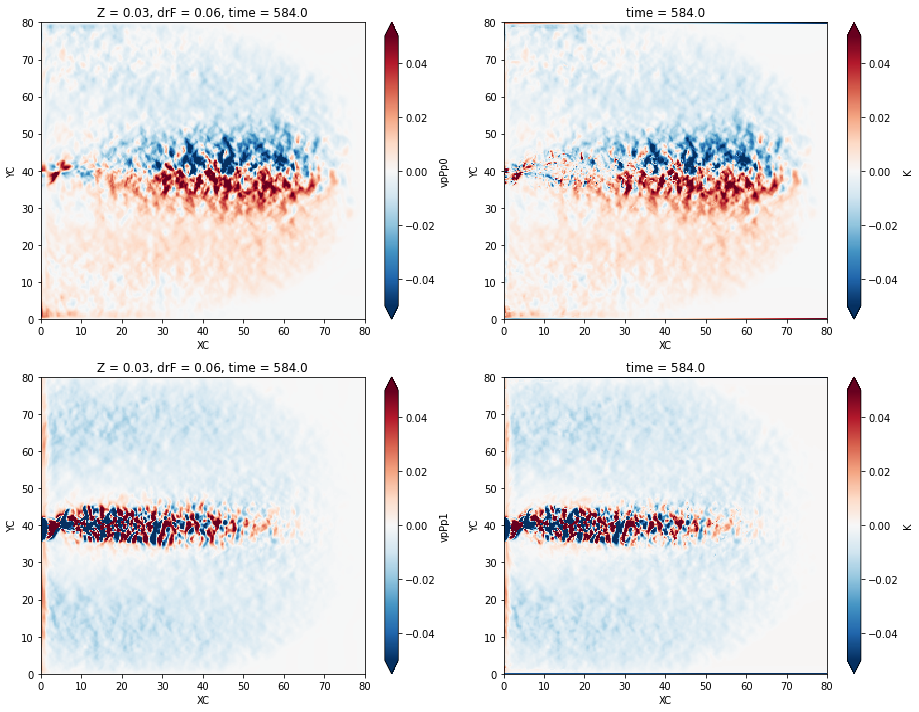

Lapse time: 17.55768871307373


distributed.utils_perf - WARNING - full garbage collections took 35% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 35% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 35% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 35% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 35% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 35% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 35% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 35% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 35% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took

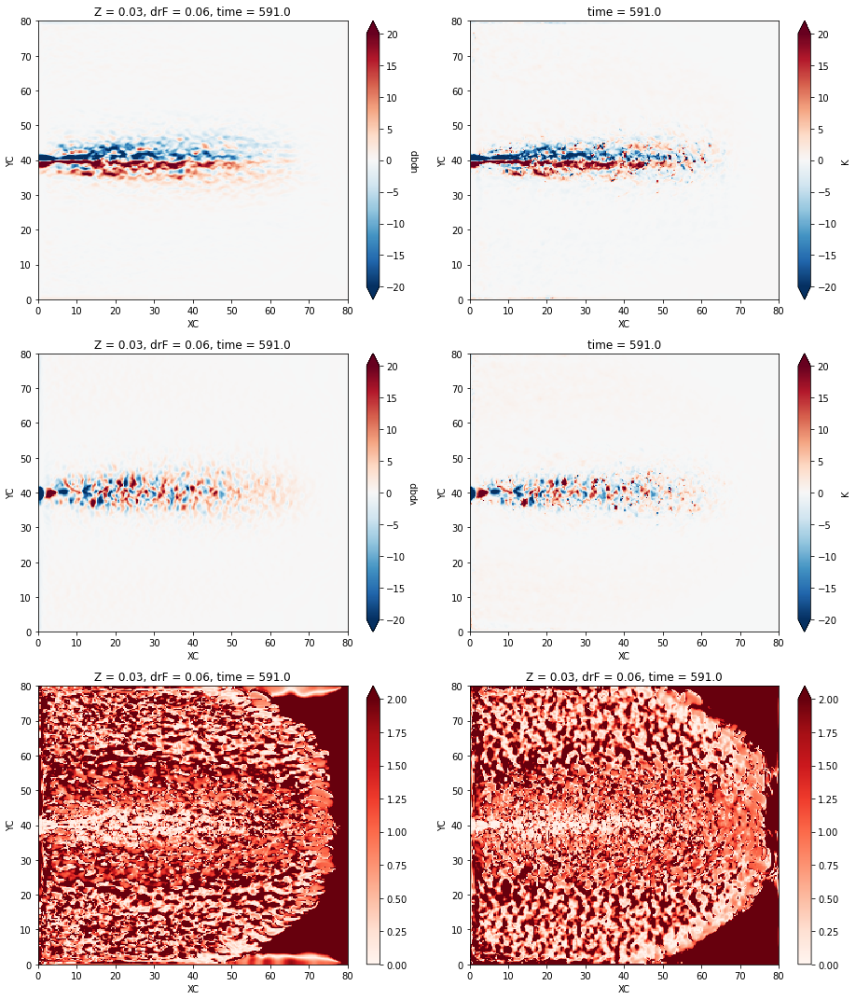

<xarray.Dataset>
Dimensions:  (XC: 256, YC: 256, time: 7)
Coordinates:
  * XC       (XC) float64 0.1562 0.4688 0.7812 1.094 ... 78.91 79.22 79.53 79.84
  * YC       (YC) float64 0.1562 0.4688 0.7812 1.094 ... 78.91 79.22 79.53 79.84
    Z        float64 0.03
    drF      float64 0.06
  * time     (time) float32 591.0 592.0 593.0 594.0 595.0 596.0 597.0
Data variables:
    exq      (time, YC, XC) float64 4.996 5.629 2.526 ... 11.23 33.74 176.0
    eyq      (time, YC, XC) float64 3.639 7.5 10.07 45.85 ... 334.3 528.5 64.52
    exP0     (time, YC, XC) float64 2.954 0.1245 0.1643 ... 3.451e+04 3.804e+07
    eyP0     (time, YC, XC) float64 2.603 2.982 3.275 ... 9.588e+07 3.775e+07
    exP1     (time, YC, XC) float64 10.48 0.3623 0.5279 ... 7.309 3.331e+07
    eyP1     (time, YC, XC) float64 11.59 13.62 18.6 ... 2.596e+07 3.404e+07
    exP2     (time, YC, XC) float64 2.388 0.02248 ... 3.465e+04 1.155e+06
    eyP2     (time, YC, XC) float64 2.418 3.007 4.094 ... 3.063e+06 1.114e+06
    exP3  

distributed.utils_perf - WARNING - full garbage collections took 42% CPU time recently (threshold: 10%)


$r^x_q$: [0.81803751 0.75719296 0.78797947 0.80972196 0.8125497  0.79614523
 0.8115043 ] $r^y_q$: [0.8986793  0.87451737 0.87226386 0.85149751 0.78976122 0.8560378
 0.79457619]
$r^x_\theta$: [0.92445365 0.92237004 0.92568492 0.92493922 0.9272148  0.92515001
 0.92271125] $r^y_\theta$: [0.92450766 0.919967   0.92368301 0.92115232 0.92702761 0.92085718
 0.91572489]
$r^x_s$: [0.9681345  0.97083868 0.96710489 0.96562382 0.96802262 0.96743826
 0.97123137] $r^y_s$: [0.99649515 0.99598476 0.99416974 0.99414562 0.99578735 0.99600904
 0.99614683]


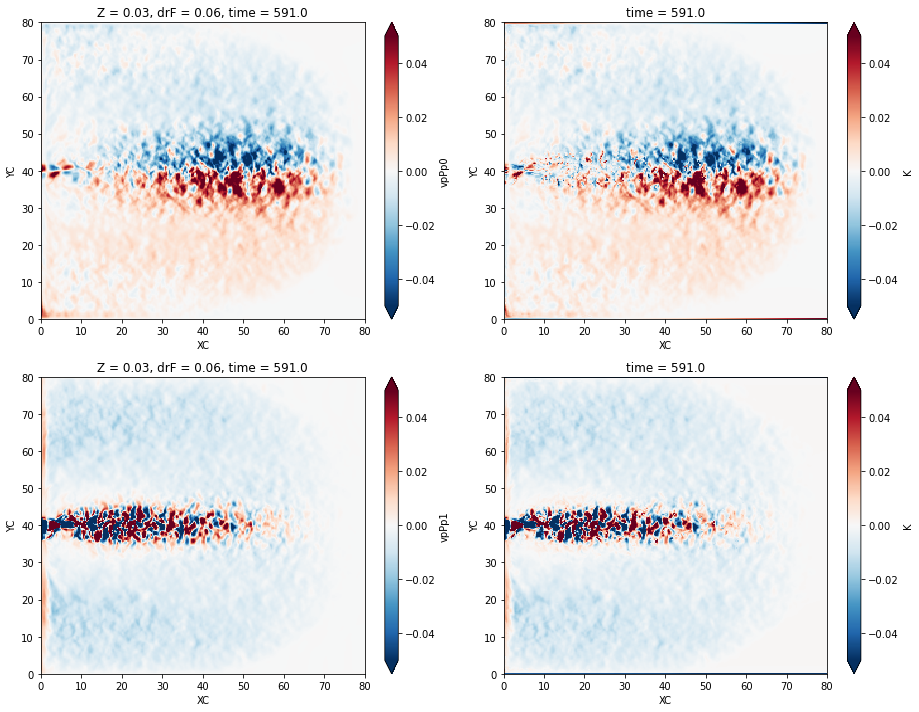

Lapse time: 19.29268169403076


distributed.utils_perf - WARNING - full garbage collections took 41% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 41% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 41% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 41% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 41% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 42% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 42% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 42% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 42% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took

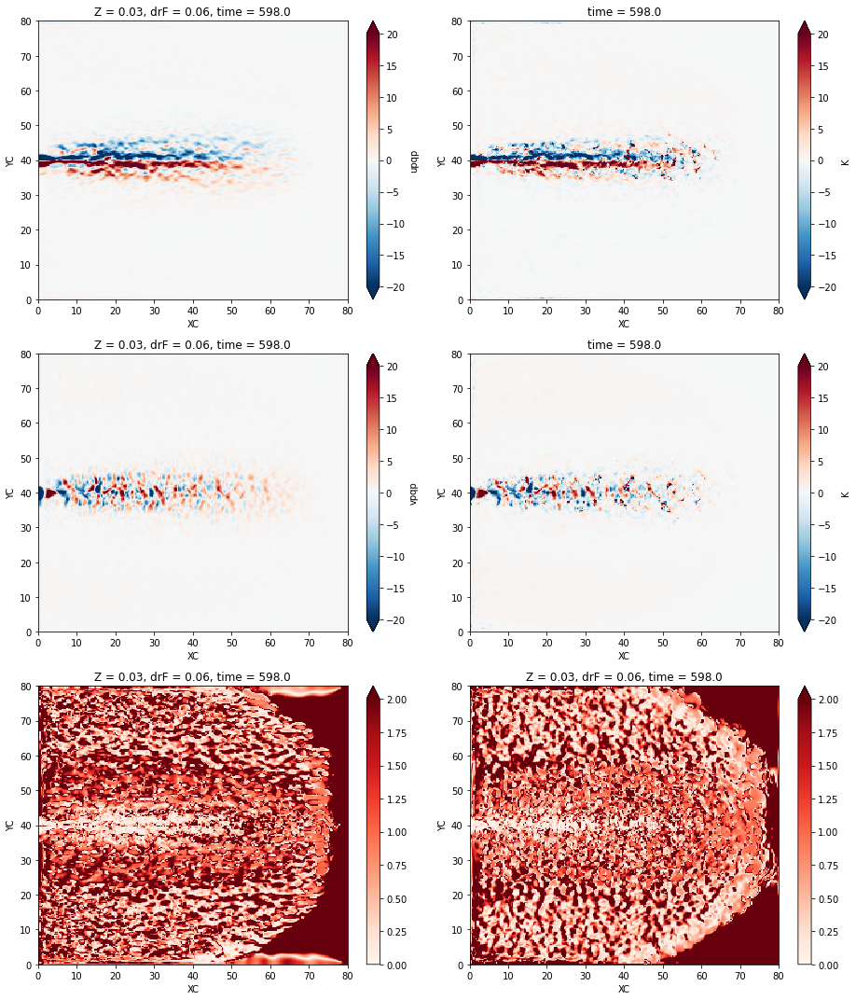

<xarray.Dataset>
Dimensions:  (XC: 256, YC: 256, time: 7)
Coordinates:
  * XC       (XC) float64 0.1562 0.4688 0.7812 1.094 ... 78.91 79.22 79.53 79.84
  * YC       (YC) float64 0.1562 0.4688 0.7812 1.094 ... 78.91 79.22 79.53 79.84
    Z        float64 0.03
    drF      float64 0.06
  * time     (time) float32 598.0 599.0 600.0 601.0 602.0 603.0 604.0
Data variables:
    exq      (time, YC, XC) float64 3.811 6.462 5.329 ... 9.044 19.48 227.0
    eyq      (time, YC, XC) float64 2.371 9.078 16.18 ... 211.5 105.6 25.21
    exP0     (time, YC, XC) float64 3.038 0.0485 0.08013 ... 2.849e+04 3.535e+07
    eyP0     (time, YC, XC) float64 2.853 2.997 3.124 ... 1.123e+08 3.652e+07
    exP1     (time, YC, XC) float64 11.28 0.1474 0.2197 ... 7.002 3.421e+07
    eyP1     (time, YC, XC) float64 11.63 13.26 16.58 ... 4.256e+07 3.631e+07
    exP2     (time, YC, XC) float64 2.747 0.0431 0.04581 ... 2.937e+04 1.105e+06
    eyP2     (time, YC, XC) float64 2.79 3.309 3.923 ... 3.888e+06 1.11e+06
    exP

distributed.utils_perf - WARNING - full garbage collections took 43% CPU time recently (threshold: 10%)


$r^x_q$: [0.81130154 0.85490399 0.82955474 0.84448971 0.84412314 0.8462235
 0.83089485] $r^y_q$: [0.86222498 0.85868666 0.8673454  0.87744573 0.88414652 0.88231858
 0.87587405]
$r^x_\theta$: [0.922119   0.92332768 0.92616067 0.92803543 0.92629361 0.92552061
 0.92543597] $r^y_\theta$: [0.91982989 0.91000643 0.92609873 0.92164187 0.93051471 0.92838488
 0.92374336]
$r^x_s$: [0.9715452  0.97423917 0.97369279 0.97165822 0.96953237 0.97287521
 0.97420756] $r^y_s$: [0.99561605 0.99595686 0.99651903 0.99645991 0.99657183 0.99647875
 0.99602023]


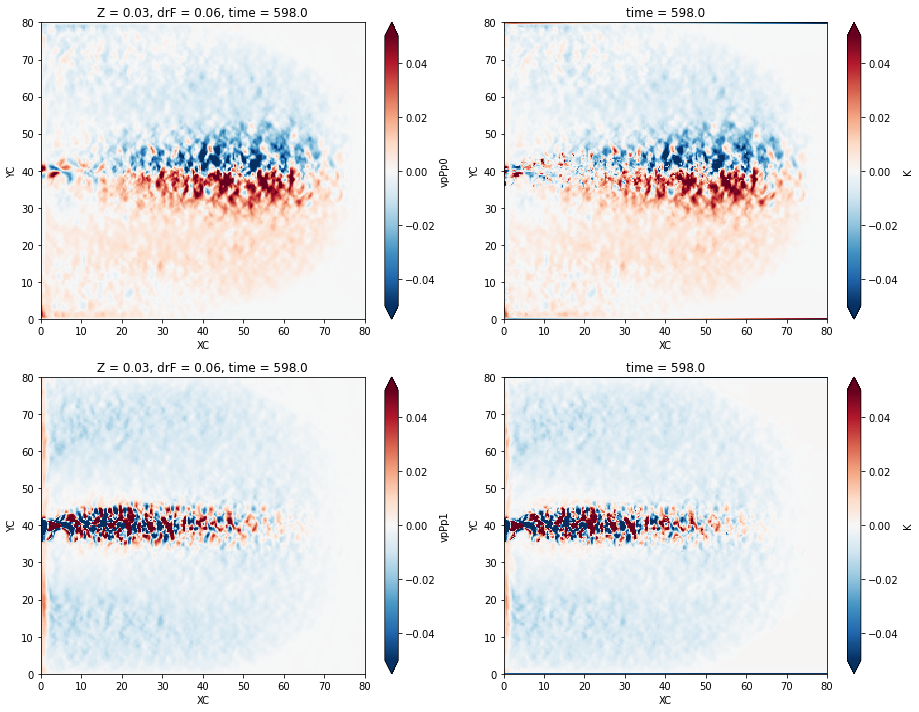

Lapse time: 18.486079216003418


distributed.utils_perf - WARNING - full garbage collections took 40% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 40% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 39% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 39% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 39% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 39% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 39% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 39% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 39% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took

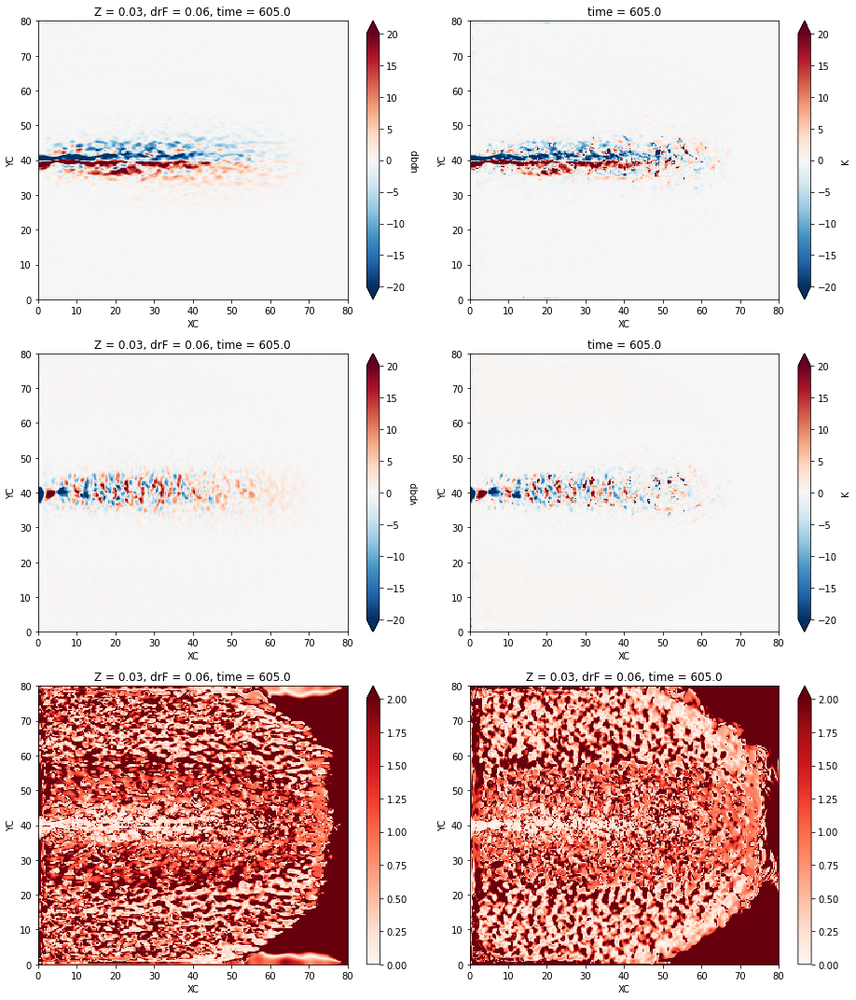

<xarray.Dataset>
Dimensions:  (XC: 256, YC: 256, time: 7)
Coordinates:
  * XC       (XC) float64 0.1562 0.4688 0.7812 1.094 ... 78.91 79.22 79.53 79.84
  * YC       (YC) float64 0.1562 0.4688 0.7812 1.094 ... 78.91 79.22 79.53 79.84
    Z        float64 0.03
    drF      float64 0.06
  * time     (time) float32 605.0 606.0 607.0 608.0 609.0 610.0 611.0
Data variables:
    exq      (time, YC, XC) float64 4.278 11.68 7.561 3.079 ... 9.37 22.86 372.2
    eyq      (time, YC, XC) float64 2.669 14.8 24.34 126.3 ... 255.2 165.5 45.96
    exP0     (time, YC, XC) float64 3.073 0.05798 0.0903 ... 2.132e+04 2.923e+07
    eyP0     (time, YC, XC) float64 2.853 3.286 3.714 ... 4.834e+07 2.985e+07
    exP1     (time, YC, XC) float64 8.79 0.1125 0.1815 ... 4.158 4.525 2.518e+07
    eyP1     (time, YC, XC) float64 9.418 12.19 19.11 ... 2.241e+07 2.543e+07
    exP2     (time, YC, XC) float64 2.231 0.005029 ... 2.168e+04 9.041e+05
    eyP2     (time, YC, XC) float64 2.414 2.912 4.169 ... 1.561e+06 8.965e

distributed.utils_perf - WARNING - full garbage collections took 36% CPU time recently (threshold: 10%)


$r^x_q$: [0.81624867 0.8276857  0.74969939 0.8263375  0.82068006 0.82562089
 0.82973253] $r^y_q$: [0.85910211 0.87567768 0.83124669 0.85108602 0.87112156 0.87314538
 0.87524423]
$r^x_\theta$: [0.9224966  0.92208064 0.91769029 0.9092326  0.91461258 0.91553253
 0.91497867] $r^y_\theta$: [0.91930036 0.92584658 0.91513815 0.92022616 0.91560682 0.9150062
 0.91930278]
$r^x_s$: [0.96970653 0.9739544  0.97198575 0.96952636 0.96893778 0.9664202
 0.96437103] $r^y_s$: [0.99599808 0.99591056 0.99526626 0.99499968 0.99587026 0.99605154
 0.99584025]


distributed.utils_perf - WARNING - full garbage collections took 36% CPU time recently (threshold: 10%)


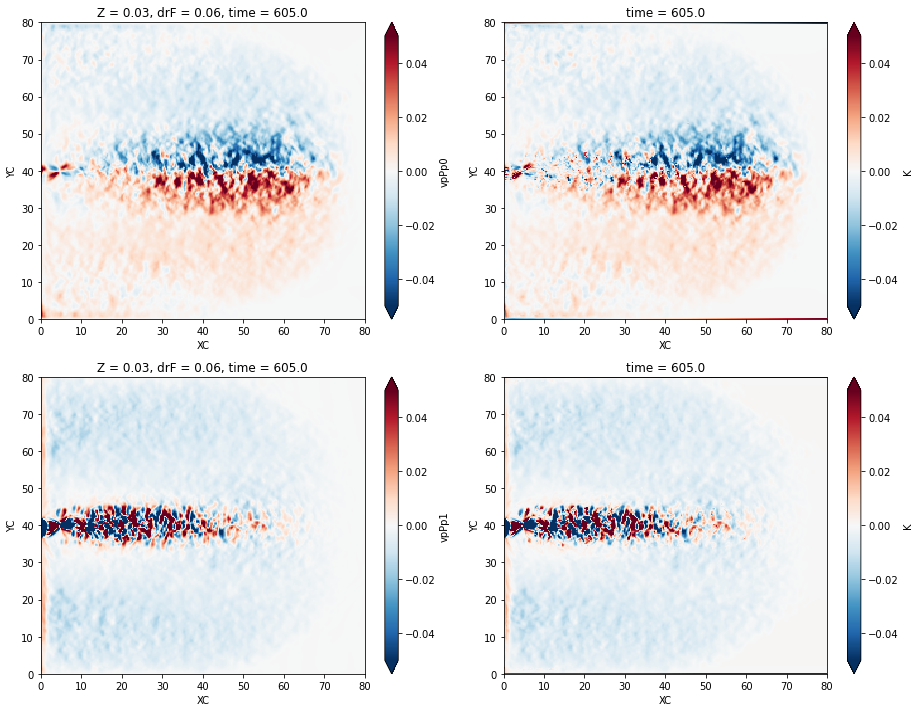

Lapse time: 20.352283000946045


distributed.utils_perf - WARNING - full garbage collections took 35% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 35% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 35% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 35% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 35% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 35% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 35% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 35% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 35% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took

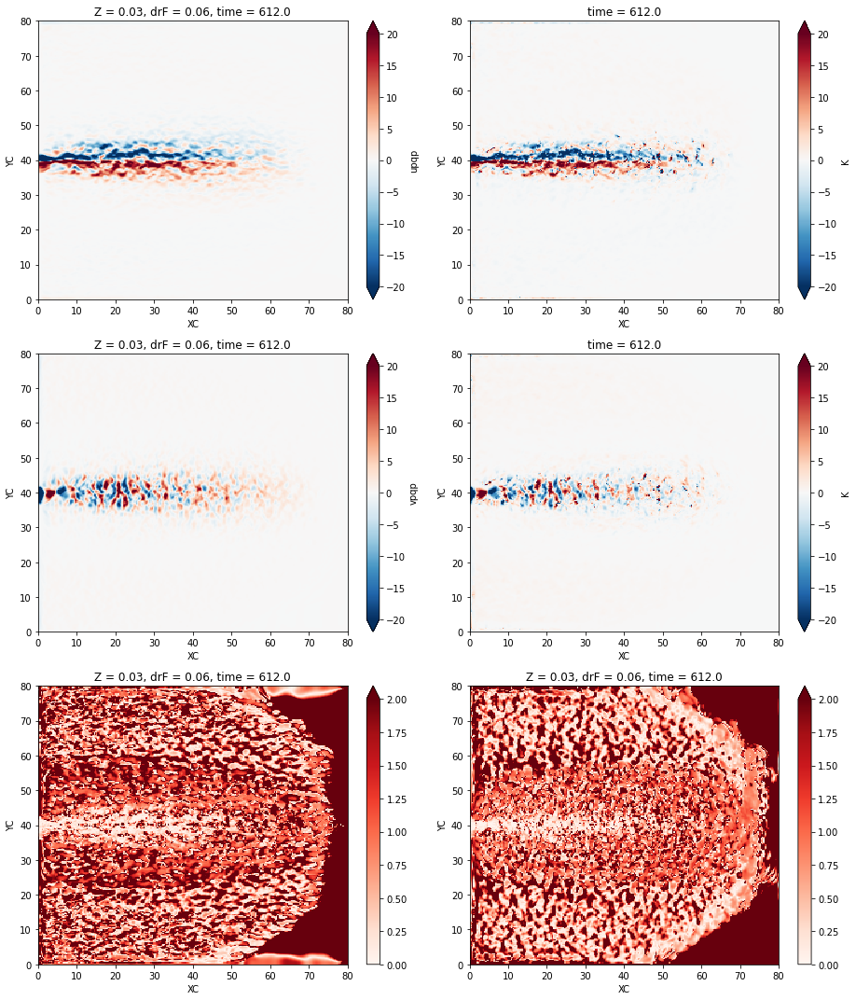

<xarray.Dataset>
Dimensions:  (XC: 256, YC: 256, time: 7)
Coordinates:
  * XC       (XC) float64 0.1562 0.4688 0.7812 1.094 ... 78.91 79.22 79.53 79.84
  * YC       (YC) float64 0.1562 0.4688 0.7812 1.094 ... 78.91 79.22 79.53 79.84
    Z        float64 0.03
    drF      float64 0.06
  * time     (time) float32 612.0 613.0 614.0 615.0 616.0 617.0 618.0
Data variables:
    exq      (time, YC, XC) float64 4.942 11.89 5.838 1.28 ... 8.497 27.23 248.0
    eyq      (time, YC, XC) float64 3.518 14.67 21.8 637.1 ... 252.7 304.9 64.95
    exP0     (time, YC, XC) float64 3.565 0.1615 0.2159 ... 3.157e+04 3.884e+07
    eyP0     (time, YC, XC) float64 3.002 3.307 3.513 ... 1.03e+08 3.936e+07
    exP1     (time, YC, XC) float64 8.151 0.2681 0.4511 ... 4.973 3.982e+07
    eyP1     (time, YC, XC) float64 9.258 11.6 18.42 ... 3.328e+07 4.135e+07
    exP2     (time, YC, XC) float64 2.117 0.04134 ... 3.163e+04 1.181e+06
    eyP2     (time, YC, XC) float64 2.233 2.751 3.782 ... 3.23e+06 1.161e+06
    ex

distributed.utils_perf - WARNING - full garbage collections took 45% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 45% CPU time recently (threshold: 10%)


$r^x_q$: [0.82016854 0.78396704 0.80415215 0.80150751 0.82962842 0.79601293
 0.8061826 ] $r^y_q$: [0.88000496 0.86886869 0.83817961 0.86918585 0.88320511 0.84956811
 0.81762299]
$r^x_\theta$: [0.91287247 0.91506274 0.92157896 0.91825848 0.92467039 0.92773807
 0.92545566] $r^y_\theta$: [0.9116382  0.92240929 0.92181347 0.92775726 0.93085524 0.9279631
 0.93243859]
$r^x_s$: [0.96486528 0.96570179 0.96189607 0.96300209 0.96600685 0.96932533
 0.96865418] $r^y_s$: [0.99548147 0.99552721 0.99560089 0.99576622 0.99562897 0.99547697
 0.99526188]


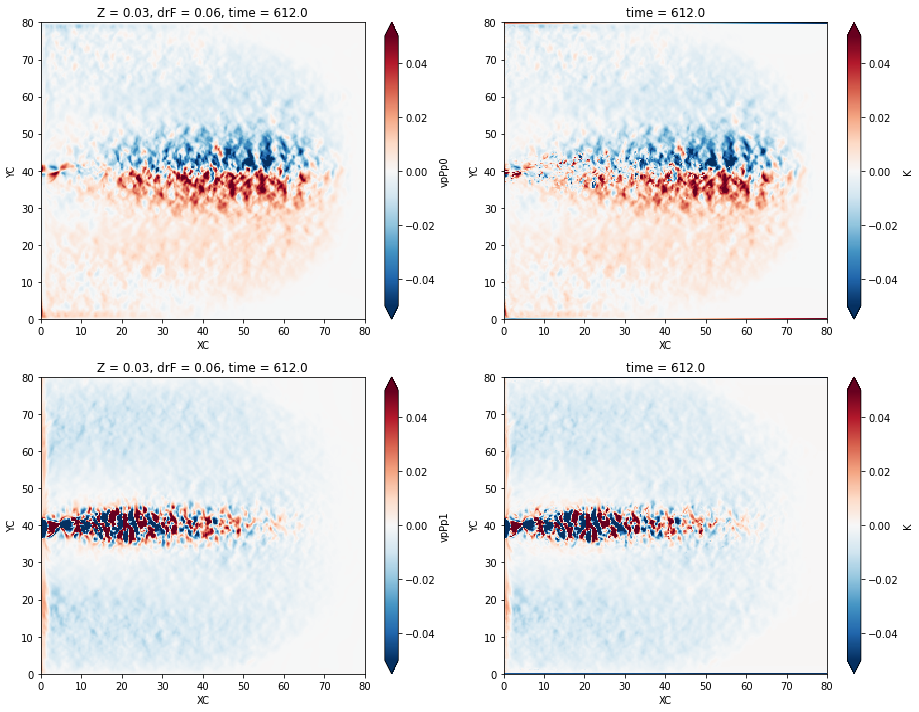

Lapse time: 20.099805116653442


distributed.utils_perf - WARNING - full garbage collections took 33% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 35% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 35% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 36% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 36% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 37% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 37% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 37% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took 37% CPU time recently (threshold: 10%)
distributed.utils_perf - WARNING - full garbage collections took

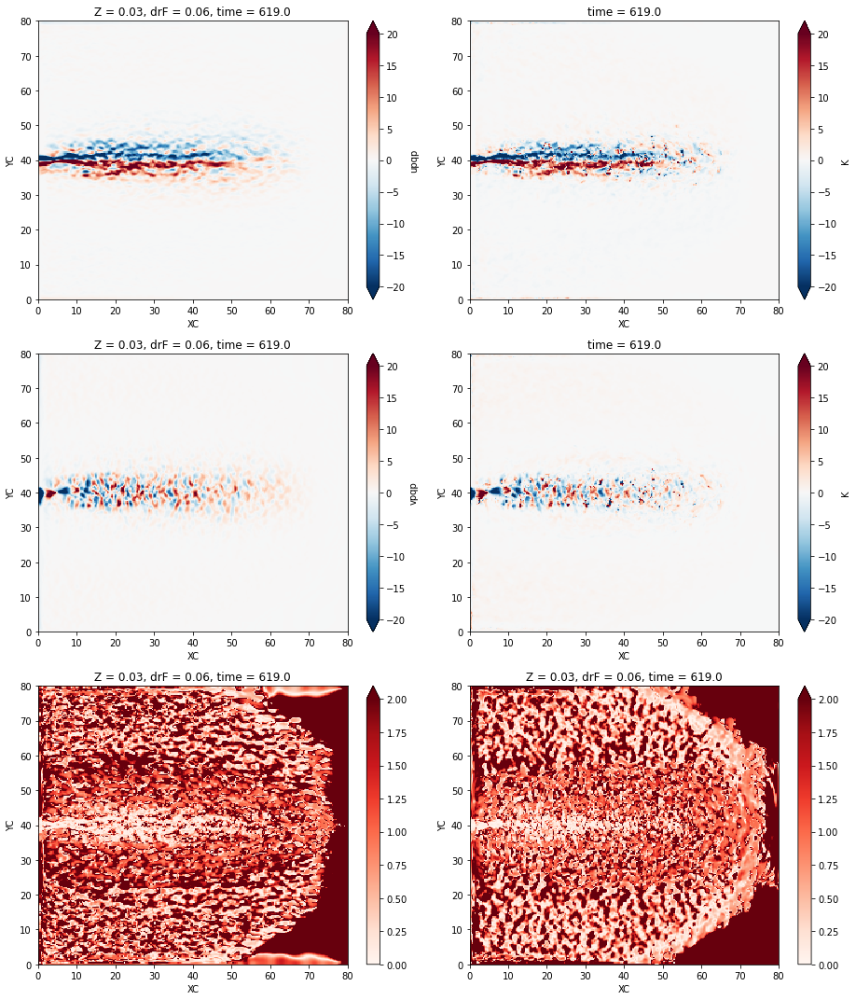

<xarray.Dataset>
Dimensions:  (XC: 256, YC: 256, time: 4)
Coordinates:
  * XC       (XC) float64 0.1562 0.4688 0.7812 1.094 ... 78.91 79.22 79.53 79.84
  * YC       (YC) float64 0.1562 0.4688 0.7812 1.094 ... 78.91 79.22 79.53 79.84
    Z        float64 0.03
    drF      float64 0.06
  * time     (time) float32 619.0 620.0 621.0 622.0
Data variables:
    exq      (time, YC, XC) float64 7.114 12.71 4.323 ... 9.468 37.79 269.3
    eyq      (time, YC, XC) float64 5.333 16.67 12.33 ... 1.191e+03 153.0
    exP0     (time, YC, XC) float64 2.344 0.02986 ... 3.839e+04 3.604e+07
    eyP0     (time, YC, XC) float64 2.187 2.564 3.42 ... 3.348e+08 3.634e+07
    exP1     (time, YC, XC) float64 8.47 0.1809 0.354 ... 2.613 2.788 3.326e+07
    eyP1     (time, YC, XC) float64 9.588 11.97 20.42 ... 3.428e+07 3.519e+07
    exP2     (time, YC, XC) float64 1.949 0.1043 0.08186 ... 3.779e+04 1.08e+06
    eyP2     (time, YC, XC) float64 2.129 2.756 4.162 ... 9.831e+06 1.057e+06
    exP3     (time, YC, XC) fl

distributed.utils_perf - WARNING - full garbage collections took 38% CPU time recently (threshold: 10%)


$r^x_q$: [0.8221019  0.83334187 0.84348537 0.83898286] $r^y_q$: [0.81757704 0.82229    0.83976073 0.8538979 ]
$r^x_\theta$: [0.92266655 0.92529244 0.92603536 0.9158034 ] $r^y_\theta$: [0.92620011 0.9219148  0.9309046  0.92549239]
$r^x_s$: [0.96541562 0.97074476 0.97486083 0.97341685] $r^y_s$: [0.99494224 0.99511495 0.99572834 0.99592125]


distributed.utils_perf - WARNING - full garbage collections took 35% CPU time recently (threshold: 10%)


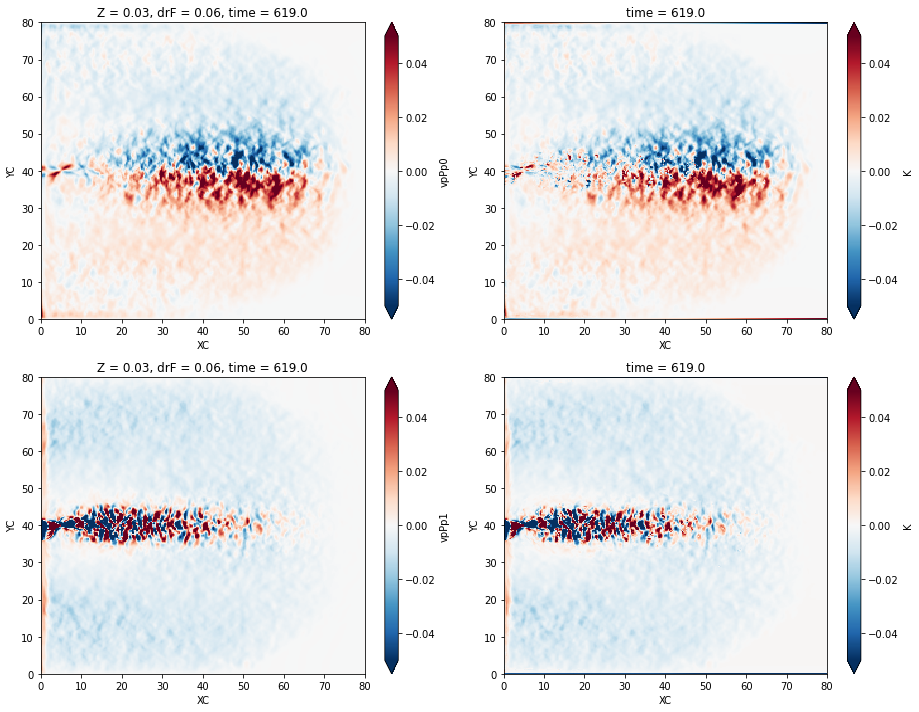

Lapse time: 18.142029762268066


distributed.utils_perf - WARNING - full garbage collections took 18% CPU time recently (threshold: 10%)


In [7]:
dtt = 7
iZ = 0
ttstart = 33
ncoars = 4
DX = dx * ncoars


for tt in range(ttstart,int(312/dtt)+1):
# for tt in range(ttstart,1):
    for i in range(nmemb+1):
        if i < nmemb:
            if i == 0:
                q = xr.open_zarr(op.join(rund, 'run%03d/vars001' % i)
                                ).q.isel(time=slice(tt*dtt,tt*dtt+dtt),Z=iZ)
            else:
                q = xr.concat([q,xr.open_zarr(op.join(rund, 'run%03d/vars001' % i)
                                             ).q.isel(time=slice(tt*dtt,tt*dtt+dtt),Z=iZ)
                              ], 'nmemb')
        else:
            q = xr.concat([q,xr.open_zarr(op.join(rund, 'ctrl/vars001')
                                         ).q.isel(time=slice(tt*dtt,tt*dtt+dtt),Z=iZ)
                          ], 'nmemb')

    qb = qgutils.pad_bc(q.mean('nmemb').coarsen(YC=ncoars, XC=ncoars, boundary='exact').mean())
    qbx = np.diff(qb[...,1:-1,:], axis=-1) / DX
    qbx = .5*(qbx[...,1:] + qbx[...,:-1])
    qby = np.diff(qb[...,1:-1], axis=-2) / DX
    qby = .5*(qby[...,1:,:] + qby[...,:-1,:])

    if tt < 44:
        dsb = xr.open_zarr(op.join(rund,"MeanPTR001/%03d-%03d" 
                                   % (tt*dtt,tt*dtt+dtt-1))).isel(Z=iZ)
        dsp = xr.open_zarr(op.join(rund,"EddyFlux001/%03d-%03d" 
                                   % (tt*dtt,tt*dtt+dtt-1))).isel(Z=iZ)
        K = xr.open_zarr(op.join(rund,'Kappas001/Z%1d/n%02d_%03d-%03d_opt/' 
                                 % (iZ,ncoars,tt*dtt,tt*dtt+dtt-1))
                        ).K
    else:
        dsb = xr.open_zarr(op.join(rund,"MeanPTR001/%03d-%03d" 
                                   % (308,311))).isel(Z=iZ)
        dsp = xr.open_zarr(op.join(rund,"EddyFlux001/%03d-%03d" 
                                   % (308,311))).isel(Z=iZ)
        K = xr.open_zarr(op.join(rund,'Kappas001/Z%1d/n%02d_%03d-%03d_opt/' 
                                 % (iZ,ncoars,308,311))
                        ).K
    
    P0b = dsb.ptr0b.coarsen(YC=ncoars, XC=ncoars, boundary='exact').mean()
    P1b = dsb.ptr1b.coarsen(YC=ncoars, XC=ncoars, boundary='exact').mean()
    P2b = dsb.ptr2b.coarsen(YC=ncoars, XC=ncoars, boundary='exact').mean()
    P3b = dsb.ptr3b.coarsen(YC=ncoars, XC=ncoars, boundary='exact').mean()
    
    P0 = qgutils.pad_bc(P0b)
    P1 = qgutils.pad_bc(P1b)
    P2 = qgutils.pad_bc(P2b)
    P3 = qgutils.pad_bc(P3b)
    DX = dx * ncoars
    P0x = np.diff(P0[...,1:-1,:], axis=-1) / DX
    P0x = .5*(P0x[...,1:] + P0x[...,:-1])
    P0y = np.diff(P0[...,1:-1], axis=-2) / DX
    P0y = .5*(P0y[...,1:,:] + P0y[...,:-1,:])
    P1x = np.diff(P1[...,1:-1,:], axis=-1) / DX
    P1x = .5*(P1x[...,1:] + P1x[...,:-1])
    P1y = np.diff(P1[...,1:-1], axis=-2) / DX
    P1y = .5*(P1y[...,1:,:] + P1y[...,:-1,:])
    P2x = np.diff(P2[...,1:-1,:], axis=-1) / DX
    P2x = .5*(P2x[...,1:] + P2x[...,:-1])
    P2y = np.diff(P2[...,1:-1], axis=-2) / DX
    P2y = .5*(P2y[...,1:,:] + P2y[...,:-1,:])
    P3x = np.diff(P3[...,1:-1,:], axis=-1) / DX
    P3x = .5*(P3x[...,1:] + P3x[...,:-1])
    P3y = np.diff(P3[...,1:-1], axis=-2) / DX
    P3y = .5*(P3y[...,1:,:] + P3y[...,:-1,:])
    
        
    Fxq = -(K[...,0,0] * qbx
            + K[...,1,0] * qby
           )
    Fyq = -(K[...,0,1] * qbx
            + K[...,1,1] * qby
           )
####
    Fx0 = -(K[...,0,0] * P0x
            + K[...,1,0] * P0y
           )
    Fy0 = -(K[...,0,1] * P0x
            + K[...,1,1] * P0y
           )
    Fx1 = -(K[...,0,0] * P1x
            + K[...,1,0] * P1y
           )
    Fy1 = -(K[...,0,1] * P1x
            + K[...,1,1] * P1y
           )
    Fx2 = -(K[...,0,0] * P2x
            + K[...,1,0] * P2y
           )
    Fy2 = -(K[...,0,1] * P2x
            + K[...,1,1] * P2y
           )
    Fx3 = -(K[...,0,0] * P3x
            + K[...,1,0] * P3y
           )
    Fy3 = -(K[...,0,1] * P3x
            + K[...,1,1] * P3y
           )

##########################
    upqp = dsp.upqp.coarsen(YC=ncoars, XC=ncoars, boundary='exact').mean()
    vpqp = dsp.vpqp.coarsen(YC=ncoars, XC=ncoars, boundary='exact').mean()
    upP0p = dsp.upPp0.coarsen(YC=ncoars, XC=ncoars, boundary='exact').mean()
    vpP0p = dsp.vpPp0.coarsen(YC=ncoars, XC=ncoars, boundary='exact').mean()
    upP1p = dsp.upPp1.coarsen(YC=ncoars, XC=ncoars, boundary='exact').mean()
    vpP1p = dsp.vpPp1.coarsen(YC=ncoars, XC=ncoars, boundary='exact').mean()
    upP2p = dsp.upPp2.coarsen(YC=ncoars, XC=ncoars, boundary='exact').mean()
    vpP2p = dsp.vpPp2.coarsen(YC=ncoars, XC=ncoars, boundary='exact').mean()
    upP3p = dsp.upPp3.coarsen(YC=ncoars, XC=ncoars, boundary='exact').mean()
    vpP3p = dsp.vpPp3.coarsen(YC=ncoars, XC=ncoars, boundary='exact').mean()

##########################
    start = time.time()
    ename = op.join(ddir,'Errors001/Z%1d/n%02d_%03d-%03d_opt/' 
                        % (iZ,ncoars,tt*dtt,tt*dtt+len(dsb.time)-1)
                   )
    exq = (np.abs(upqp - Fxq) / np.abs(upqp)).compute()
    eyq = (np.abs(vpqp - Fyq) / np.abs(vpqp)).compute()
    exP0 = (np.abs(upP0p - Fx0) / np.abs(upP0p)).compute()
    eyP0 = (np.abs(vpP0p - Fy0) / np.abs(vpP0p)).compute()
    exP1 = (np.abs(upP1p - Fx1) / np.abs(upP1p)).compute()
    eyP1 = (np.abs(vpP1p - Fy1) / np.abs(vpP1p)).compute()
    exP2 = (np.abs(upP2p - Fx2) / np.abs(upP2p)).compute()
    eyP2 = (np.abs(vpP2p - Fy2) / np.abs(vpP2p)).compute()
    exP3 = (np.abs(upP3p - Fx3) / np.abs(upP3p)).compute()
    eyP3 = (np.abs(vpP3p - Fy3) / np.abs(vpP3p)).compute()
        
    fig, axes = plt.subplots(figsize=(13,15), nrows=3, ncols=2)
    fig.set_tight_layout(True)
    upqp.isel(time=0).plot(ax=axes[0,0], vmax=20)
    Fxq.isel(time=0).plot(ax=axes[0,1], vmax=20)
    vpqp.isel(time=0).plot(ax=axes[1,0], vmax=20)
    Fyq.isel(time=0).plot(ax=axes[1,1], vmax=20)
    exq.isel(time=0).plot(ax=axes[2,0], vmax=2., vmin=0., cmap='Reds')
    eyq.isel(time=0).plot(ax=axes[2,1], vmax=2., vmin=0., cmap='Reds')
    plt.show()
    

    dsave = exq.to_dataset(name='exq')
    dsave['eyq'] = eyq
    dsave['exP0'] = exP0
    dsave['eyP0'] = eyP0
    dsave['exP1'] = exP1
    dsave['eyP1'] = eyP1
    dsave['exP2'] = exP2
    dsave['eyP2'] = eyP2
    dsave['exP3'] = exP3
    dsave['eyP3'] = eyP3
    dsave.to_zarr(ename, mode='w')
    print(dsave)
    dsave.close()
    del exq,eyq,exP0,eyP0,exP1,eyP1,exP2,eyP2,exP3,eyP3

##########################
    upqp_ = upqp.mean(['YC','XC'],skipna=True)
    Fxq_ = Fxq.mean(['YC','XC'],skipna=True)
    rx1 = ((upqp - upqp_) * (Fxq - Fxq_)).sum(['YC','XC'],skipna=True)
    rx2 = np.sqrt(((upqp - upqp_)**2).sum(['YC','XC'],skipna=True))
    rx3 = np.sqrt(((Fxq - Fxq_)**2).sum(['YC','XC'],skipna=True))

    vpqp_ = vpqp.mean(['YC','XC'],skipna=True)
    Fyq_ = Fyq.mean(['YC','XC'],skipna=True)
    ry1 = ((vpqp - vpqp_) * (Fyq - Fyq_)).sum(['YC','XC'],skipna=True)
    ry2 = np.sqrt(((vpqp - vpqp_)**2).sum(['YC','XC'],skipna=True))
    ry3 = np.sqrt(((Fyq - Fyq_)**2).sum(['YC','XC'],skipna=True))
# ####    
    upP0p_ = upP0p.mean(['YC','XC'],skipna=True)
    Fx0_ = Fx0.mean(['YC','XC'],skipna=True)
    rx4 = ((upP0p - upP0p_) * (Fx0 - Fx0_)).sum(['YC','XC'],skipna=True)
    rx5 = np.sqrt(((upP0p - upP0p_)**2).sum(['YC','XC'],skipna=True))
    rx6 = np.sqrt(((Fx0 - Fx0_)**2).sum(['YC','XC'],skipna=True))

    vpP0p_ = vpP0p.mean(['YC','XC'],skipna=True)
    Fy0_ = Fy0.mean(['YC','XC'],skipna=True)
    ry4 = ((vpP0p - vpP0p_) * (Fy0 - Fy0_)).sum(['YC','XC'],skipna=True)
    ry5 = np.sqrt(((vpP0p - vpP0p_)**2).sum(['YC','XC'],skipna=True))
    ry6 = np.sqrt(((Fy0 - Fy0_)**2).sum(['YC','XC'],skipna=True))
# ####    
    upP1p_ = upP1p.mean(['YC','XC'],skipna=True)
    Fx1_ = Fx1.mean(['YC','XC'],skipna=True)
    rx7 = ((upP1p - upP1p_) * (Fx1 - Fx1_)).sum(['YC','XC'],skipna=True)
    rx8 = np.sqrt(((upP1p - upP1p_)**2).sum(['YC','XC'],skipna=True))
    rx9 = np.sqrt(((Fx1 - Fx1_)**2).sum(['YC','XC'],skipna=True))

    vpP1p_ = vpP1p.mean(['YC','XC'],skipna=True)
    Fy1_ = Fy1.mean(['YC','XC'],skipna=True)
    ry7 = ((vpP1p - vpP1p_) * (Fy1 - Fy1_)).sum(['YC','XC'],skipna=True)
    ry8 = np.sqrt(((vpP1p - vpP1p_)**2).sum(['YC','XC'],skipna=True))
    ry9 = np.sqrt(((Fy1 - Fy1_)**2).sum(['YC','XC'],skipna=True))
# ####    
    upP2p_ = upP2p.mean(['YC','XC'],skipna=True)
    Fx2_ = Fx2.mean(['YC','XC'],skipna=True)
    rx10 = ((upP2p - upP2p_) * (Fx2 - Fx2_)).sum(['YC','XC'],skipna=True)
    rx11 = np.sqrt(((upP2p - upP2p_)**2).sum(['YC','XC'],skipna=True))
    rx12 = np.sqrt(((Fx2 - Fx2_)**2).sum(['YC','XC'],skipna=True))

    vpP2p_ = vpP2p.mean(['YC','XC'],skipna=True)
    Fy2_ = Fy2.mean(['YC','XC'],skipna=True)
    ry10 = ((vpP2p - vpP2p_) * (Fy2 - Fy2_)).sum(['YC','XC'],skipna=True)
    ry11 = np.sqrt(((vpP2p - vpP2p_)**2).sum(['YC','XC'],skipna=True))
    ry12 = np.sqrt(((Fy2 - Fy2_)**2).sum(['YC','XC'],skipna=True))
# ####    
    upP3p_ = upP3p.mean(['YC','XC'],skipna=True)
    Fx3_ = Fx3.mean(['YC','XC'],skipna=True)
    rx13 = ((upP3p - upP3p_) * (Fx3 - Fx3_)).sum(['YC','XC'],skipna=True)
    rx14 = np.sqrt(((upP3p - upP3p_)**2).sum(['YC','XC'],skipna=True))
    rx15 = np.sqrt(((Fx3 - Fx3_)**2).sum(['YC','XC'],skipna=True))

    vpP3p_ = vpP3p.mean(['YC','XC'],skipna=True)
    Fy3_ = Fy3.mean(['YC','XC'],skipna=True)
    ry13 = ((vpP3p - vpP3p_) * (Fy3 - Fy3_)).sum(['YC','XC'],skipna=True)
    ry14 = np.sqrt(((vpP3p - vpP3p_)**2).sum(['YC','XC'],skipna=True))
    ry15 = np.sqrt(((Fy3 - Fy3_)**2).sum(['YC','XC'],skipna=True))
    
# ##########################
    tmp1 = (rx1 * (rx2*rx3)**-1).compute()
    tmp2 = (ry1 * (ry2*ry3)**-1).compute()
    tmp3 = (rx4 * (rx5*rx6)**-1).compute()
    tmp4 = (ry4 * (ry5*ry6)**-1).compute()
    tmp5 = (rx7 * (rx8*rx9)**-1).compute()
    tmp6 = (ry7 * (ry8*ry9)**-1).compute()
    tmp7 = (rx10 * (rx11*rx12)**-1).compute()
    tmp8 = (ry10 * (ry11*ry12)**-1).compute()
    tmp9 = (rx13 * (rx14*rx15)**-1).compute()
    tmp10 = (ry13 * (ry14*ry15)**-1).compute()


    print(r"$r^x_q$:", tmp1.values, 
          r"$r^y_q$:", tmp2.values)
    print(r"$r^x_1$:", tmp3.values, 
          r"$r^y_1$:", tmp4.values)
    print(r"$r^x_2$:", tmp5.values, 
          r"$r^y_2$:", tmp6.values)
    fig, axes = plt.subplots(figsize=(13,10), nrows=2, ncols=2)
    fig.set_tight_layout(True)
    vpP0p.isel(time=0).plot(ax=axes[0,0], vmax=.05)
    Fy0.isel(time=0).plot(ax=axes[0,1], vmax=.05)
    vpP1p.isel(time=0).plot(ax=axes[1,0], vmax=.05)
    Fy1.isel(time=0).plot(ax=axes[1,1], vmax=.05)
    plt.show()


    dsb.close()
    dsp.close()

    
    end = time.time()
    print("Lapse time:", end-start)
#     print(itime)
    
##########################
    dsave = tmp1.to_dataset(name='rxq')
    dsave['ryq'] = tmp2
    dsave['rxP0'] = tmp3
    dsave['ryP0'] = tmp4
    dsave['rxP1'] = tmp5
    dsave['ryP1'] = tmp6
    dsave['rxP2'] = tmp7
    dsave['ryP2'] = tmp8
    dsave['rxP3'] = tmp9
    dsave['ryP3'] = tmp10
    dsave.to_zarr(op.join(ddir,'Corr-coeff001/Z%1d/n%02d_%03d-%03d_opt/' 
                          % (iZ,ncoars,tt*dtt,tt*dtt+len(dsb.time)-1)), 
                  mode='w')
    dsave.close()
    del tmp1,tmp2,tmp3,tmp4,tmp5,tmp6,tmp7,tmp8,tmp9,tmp10
# #     dsave = rxP.to_dataset(name='rxP')
# #     dsave['ryP'] = ryP
# #     dsave['rxT'] = rxT
# #     dsave['ryT'] = ryT
# #     dsave['rxS'] = rxS
# #     dsave['ryS'] = ryS
# #     dsave.to_netcdf(op.join(ddir,'5Dave/run%4d/CorrCoef_isig%2d-%2d_%010d.nc' 
# #                             % (year,sstart,send,itime)))
# #     dsave.close()